# <font color='blue'><u>CAPSTONE PROJECT TURBINE ENGINE</u></font>

## <u>Name:- Amardeep Singh</u>
## <u>Email:- amardeeps5201@gmail.com</u>

In [ ]:
#References
#https://github.com/Jason-M-Richards/Fault-Detection-Methodologies

In [2]:
#Error Function for Competitive Data
def score(y_true,y_pred,a1=10,a2=13):
    score = 0
    d = y_pred - y_true
    for i in d:
        if i >= 0 :
            score += math.exp(i/a2) - 1   
        else:
            score += math.exp(- i/a1) - 1
    return score

In [3]:
def score_func(y_true,y_pred):
    lst = [round(score(y_true,y_pred),2), 
          round(mean_absolute_error(y_true,y_pred),2),
          round(mean_squared_error(y_true,y_pred),2)**0.5,
          round(r2_score(y_true,y_pred),2)]
    
    print(f' compatitive score {lst[0]}')
    print(f' mean absolute error {lst[1]}')
    print(f' root mean squared error {lst[2]}')
    print(f' R2 score {lst[3]}')
    return [lst[1], round(lst[2],2), lst[3]*100]
    

In [69]:
def lstm_data_preprocessing(raw_train_data, raw_test_data, raw_RUL_data):
    train_df = raw_train_data
    truth_df = raw_RUL_data
    truth_df.drop(truth_df.columns[[1]], axis=1, inplace=True)
    w1 = 30
    w0 = 15
    train_df['label1'] = np.where(train_df['RUL'] <= w1, 1, 0 )
    train_df['label2'] = train_df['label1']
    train_df.loc[train_df['RUL'] <= w0, 'label2'] = 2
    
    # MinMax normalization (from 0 to 1)
    train_df['cycle_norm'] = train_df['time_in_cycles']
    cols_normalize = train_df.columns.difference(['unit_number','time_in_cycles','RUL','label1','label2']) # NORMALIZE COLUMNS except [id , cycle, rul ....]

    min_max_scaler = MinMaxScaler()

    norm_train_df = pd.DataFrame(min_max_scaler.fit_transform(train_df[cols_normalize]), 
                                 columns=cols_normalize, 
                                 index=train_df.index)

    join_df = train_df[train_df.columns.difference(cols_normalize)].join(norm_train_df)
    train_df = join_df.reindex(columns = train_df.columns)
    print("train_df >> ",train_df.head())
    print("\n")
    

In [ ]:
    test_df['cycle_norm'] = test_df['time_in_cycles']
    norm_test_df = pd.DataFrame(min_max_scaler.transform(test_df[cols_normalize]), 
                                columns=cols_normalize, 
                                index=test_df.index)
    test_join_df = test_df[test_df.columns.difference(cols_normalize)].join(norm_test_df)
    test_df = test_join_df.reindex(columns = test_df.columns)
    test_df = test_df.reset_index(drop=True)
    
    # We use the ground truth dataset to generate labels for the test data.
    # generate column max for test data
    rul = pd.DataFrame(test_df.groupby('unit_number')['time_in_cycles'].max()).reset_index()
    rul.columns = ['unit_number','max']
    truth_df.columns = ['more']
    truth_df['unit_number'] = truth_df.index + 1
    truth_df['max'] = rul['max'] + truth_df['more'] # adding true-rul vlaue + max cycle of test data set w.r.t MID
    truth_df.drop('more', axis=1, inplace=True)

## <font color='blue'><u>Generating New Features</u></font>

In [130]:
Inputs=["op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21"]
df_1=dftr_1.drop(columns=['unit number','time_cycles','RUL'])

In [158]:
import pywt
import seaborn as sns
import scaleogram as scg 
import matplotlib.pyplot as plt
import matplotlib.gridspec as GridSpec
from mat4py import loadmat
from scipy.fftpack import fft
N = 10000
x_values_wvt = dftr_1['op_set_2']
amplitudes = [2, 5, 9]
frequencies = [1, 7, 15]
y_values_0 = amplitudes[0]*np.cos(2*np.pi*frequencies[0]*x_values) 
y_values_1 = amplitudes[1]*np.sin(2*np.pi*frequencies[1]*x_values) 
y_values_2 = amplitudes[2]*np.cos(2*np.pi*frequencies[2]*x_values + 0.4) 
full_signal_values = (y_values_0 + y_values_1 - y_values_2)



Default wavelet function used to compute the transform: morl ( Morlet wavelet )


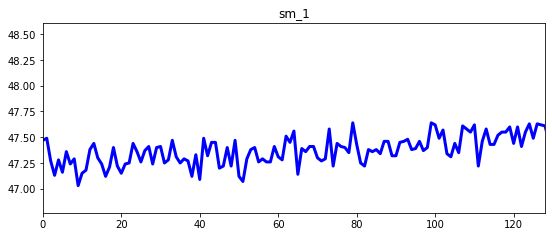

In [163]:
# choose default wavelet function 
scg.set_default_wavelet('morl')

nn = 33
signal_length = 128
# range of scales to perform the transform
scales = scg.periods2scales( np.arange(1, signal_length+1) )
x_values_wvt_arr = range(0,len(dftr_1['sm_7']),1)

# plot the signal 
fig1, ax1 = plt.subplots(1, 1, figsize=(9, 3.5));  
ax1.plot(x_values_wvt_arr, dftr_1['sm_11'], linewidth=3, color='blue')
ax1.set_xlim(0, signal_length)
ax1.set_title("sm_1")

print("Default wavelet function used to compute the transform:", scg.get_default_wavelet(), "(",
      pywt.ContinuousWavelet(scg.get_default_wavelet()).family_name, ")")

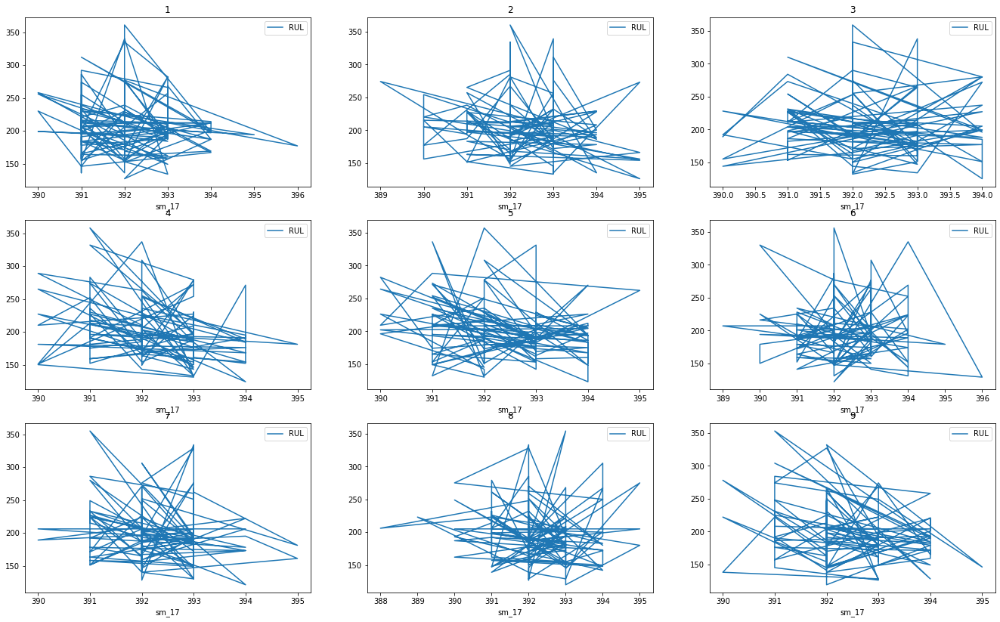

In [74]:
fig, axes = plt.subplots(3,3, figsize = (23, 14))
for (desc, group), ax in zip(dftr_1.groupby('time_cycles'), axes.flatten()):
    group.plot(x='sm_17', y='RUL', title=desc, ax=ax)
    
plt.show()

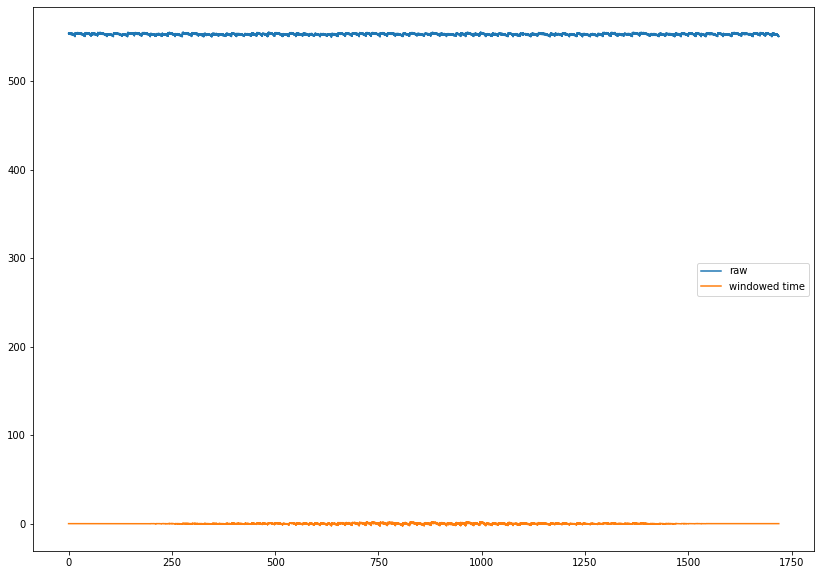

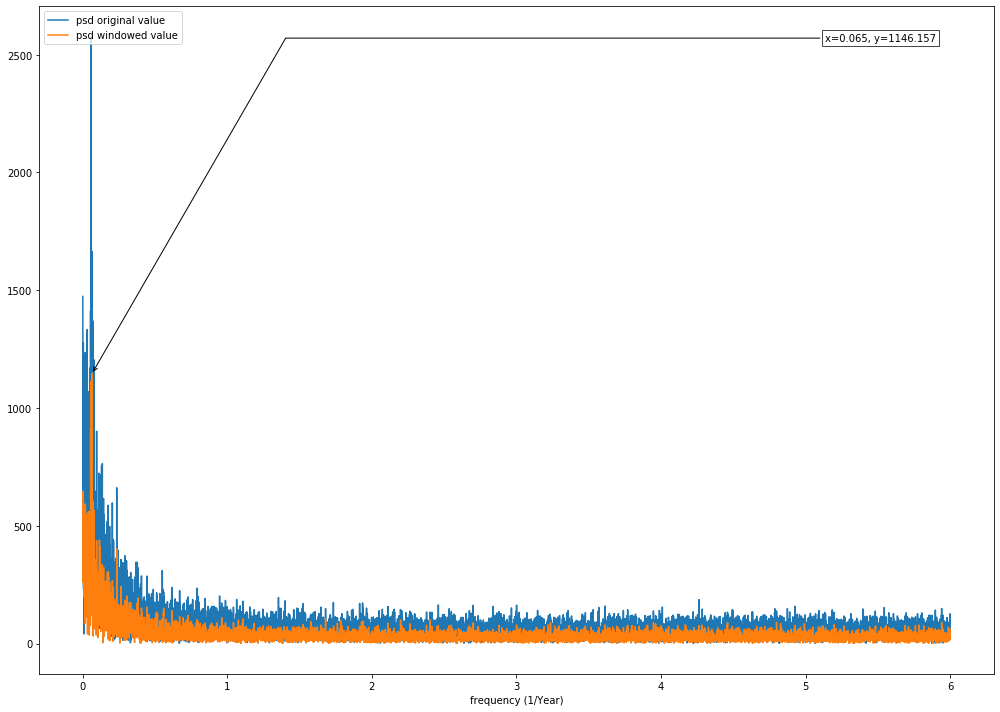

In [77]:
from scipy.signal import blackman
from numpy.fft import rfft, rfftfreq
from numpy.fft import fft, fftshift
from scipy.signal import blackman
from scipy.fftpack import fft, fftfreq
def create_sin_wave(freq, time):
    return np.sin(2 * np.pi * freq * time)


def create_cosine_wave(freq, time):
    return np.cos(2 * np.pi * freq * time)


def annot_max(x, y, ax=None):
    xmax = x[np.argmax(y)]
    ymax = y.max()
    text= "x={:.3f}, y={:.3f}".format(xmax, ymax)
    if not ax:
        ax=plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax),  xytext=(0.94, 0.96), **kw)
def plot_ori_window(time_: np.ndarray, 
                    val_orig: pd.core.series.Series, 
                    val_window: pd.core.series.Series):
    plt.figure(figsize=(14, 10))
    plt.plot(time_, val_orig, label='raw')
    plt.plot(time_, val_window, label='windowed time')
    plt.legend()
    plt.show()
    return


def plot_ft_result(val_orig_psd: np.ndarray, 
                   val_widw_psd: np.ndarray,
                   ft_smpl_freq: np.ndarray,
                   pos: int=2, annot_mode: bool=True
                  ):
    """
    For PSD graph, the first few points are removed because it represents the baseline (or mean)
    """
    plt.figure(figsize=(14, 10))
    plt.plot(ft_smpl_freq[pos: ], val_orig_psd[pos: ], label='psd original value')
    plt.plot(ft_smpl_freq[pos: ], val_widw_psd[pos: ], label='psd windowed value')
    if annot_mode:
        annot_max(ft_smpl_freq[pos:], abs(val_widw_psd[pos: ]))
        
    plt.xlabel('frequency (1/Year)')
    plt.legend(loc="upper left")
    plt.tight_layout()
    plt.show()
    return


_val_orig =dftr_1['sm_7']
_time = np.linspace(0, len(_val_orig) / 12, len(_val_orig), endpoint=False)
_val_widw = (_val_orig - np.median(_val_orig)) * blackman(len(_val_orig))

# rfft() method is used because the data is real valued
# rfftfreq() method is used to generate the frequency list (usage with rfft)
#  remark: the array f contains the frequency bin centers in cycles per unit of the sample spacing
#    with zero at the start. If the sample spacing is in years, then the frequency unit is cycles/year.
_val_orig_psd = abs(rfft(_val_orig))
_val_widw_psd = abs(rfft(_val_widw))
_val_freqs = rfftfreq(len(_val_orig), d=1./12.)

plot_ori_window(time_=_time, val_orig=_val_orig, val_window=_val_widw)
plot_ft_result(val_orig_psd=_val_orig_psd, val_widw_psd=_val_widw_psd, ft_smpl_freq=_val_freqs)

C:\Users\Amardeep\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

the 'freq'' keyword is deprecated, use 'period' instead



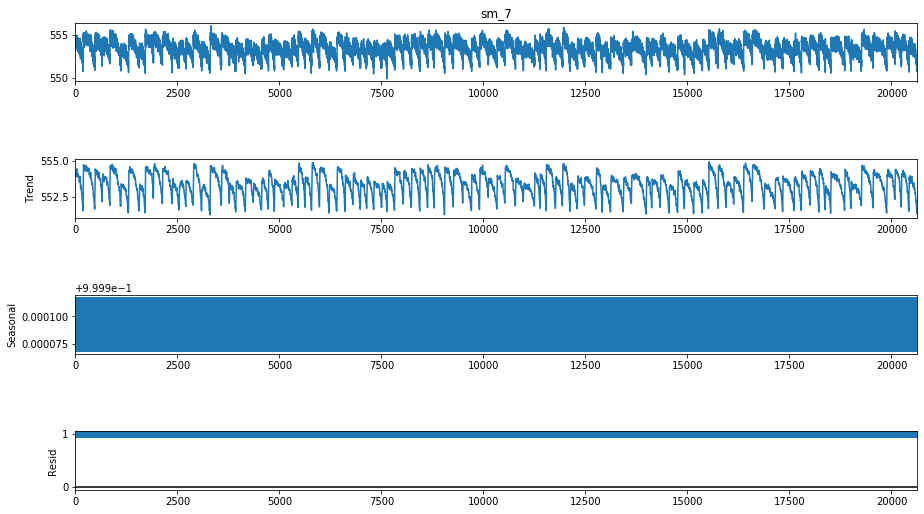

In [167]:
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(_val_orig, model='multiplicative', freq=12)
fig = result.plot()
fig.set_size_inches(15, 8)
plt.show()

C:\Users\Amardeep\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning:

In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.



(-5, 110)

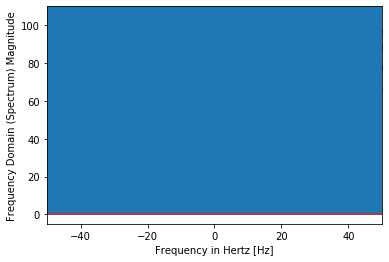

In [168]:
from scipy import fftpack

X = fftpack.fft(dftr_1['sm_4'])
freqs = fftpack.fftfreq(len(x)) * f_s

fig, ax = plt.subplots()

ax.stem(freqs, np.abs(X))
ax.set_xlabel('Frequency in Hertz [Hz]')
ax.set_ylabel('Frequency Domain (Spectrum) Magnitude')
ax.set_xlim(-f_s / 2, f_s / 2)
ax.set_ylim(-5, 110)

In [169]:
from scipy.signal import hilbert, chirp
duration = 1.0
fs = 400.0
samples = int(fs*duration)
t = np.arange(samples) / fs
signal=dftr_1['sm_7']
analytic_signal = hilbert(signal)
amplitude_envelope = np.abs(analytic_signal)
instantaneous_phase = np.unwrap(np.angle(analytic_signal))
instantaneous_frequency = (np.diff(instantaneous_phase) /
                           (2.0*np.pi) * fs)

In [132]:
from pandas import DataFrame
from pandas import concat
data_train_1= prepare_train_data(data_train_1)
temps = DataFrame(data_train_1['RUL'].values)
dataframe = concat([temps.shift(3), temps.shift(2), temps.shift(1), temps], axis=1)
dataframe.columns = ['t-3', 't-2', 't-1', 't+1']
print(dataframe.head(5))

     t-3    t-2    t-1  t+1
0    NaN    NaN    NaN  191
1    NaN    NaN  191.0  190
2    NaN  191.0  190.0  189
3  191.0  190.0  189.0  188
4  190.0  189.0  188.0  187


In [134]:
shifted = temps.shift(1)
window = shifted.rolling(window=2)
means = window.mean()
dataframe = concat([means, temps], axis=1)
dataframe.columns = ['mean(t-2,t-1)', 't+1']
print(dataframe.head(5))

   mean(t-2,t-1)  t+1
0            NaN  191
1            NaN  190
2          190.5  189
3          189.5  188
4          188.5  187


In [135]:
width = 3
shifted = temps.shift(width - 1)
window = shifted.rolling(window=width)
dataframe = concat([window.min(), window.mean(), window.max(), temps], axis=1)
dataframe.columns = ['min', 'mean', 'max', 't+1']
print(dataframe.head(5))

     min   mean    max  t+1
0    NaN    NaN    NaN  191
1    NaN    NaN    NaN  190
2    NaN    NaN    NaN  189
3    NaN    NaN    NaN  188
4  189.0  190.0  191.0  187


In [136]:
window = temps.expanding()
dataframe = concat([window.min(), window.mean(), window.max(), temps.shift(-1)], axis=1)
dataframe.columns = ['min', 'mean', 'max', 't+1']
print(dataframe.head(5))

     min   mean    max    t+1
0  191.0  191.0  191.0  190.0
1  190.0  190.5  191.0  189.0
2  189.0  190.0  191.0  188.0
3  188.0  189.5  191.0  187.0
4  187.0  189.0  191.0  186.0


In [47]:
from scipy.fftpack import fft

def get_fft_values(y_values, T, N, f_s):
    f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)
    fft_values_ = fft(y_values)
    fft_values = 2.0/N * np.abs(fft_values_[0:N//2])
    return f_values, fft_values

t_n = 10
N = 1000
T = t_n / N
f_s = 1/T

f_values, fft_values = get_fft_values(composite_y_value, T, N, f_s)

plt.plot(f_values, fft_values, linestyle='-', color='blue')
plt.xlabel('Frequency [Hz]', fontsize=16)
plt.ylabel('Amplitude', fontsize=16)
plt.title("Frequency domain of the signal", fontsize=16)
plt.show()

NameError: name 'composite_y_value' is not defined

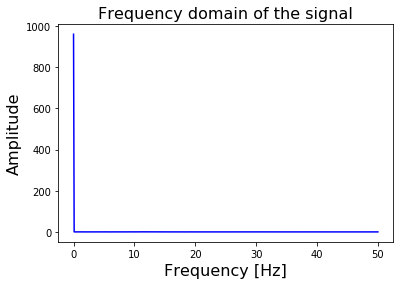

In [22]:
from scipy.fftpack import fft

def get_fft_values(y_values, T, N, f_s):
    f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)
    fft_values_ = fft(y_values)
    fft_values = 2.0/N * np.abs(fft_values_[0:N//2])
    return f_values, fft_values

t_n = 10
N = 1000
T = t_n / N
f_s = 1/T

f_values, fft_values = get_fft_values(data_train_1['sm_21'], T, N, f_s)

plt.plot(f_values, fft_values, linestyle='-', color='blue')
plt.xlabel('Frequency [Hz]', fontsize=16)
plt.ylabel('Amplitude', fontsize=16)
plt.title("Frequency domain of the signal", fontsize=16)
plt.show()

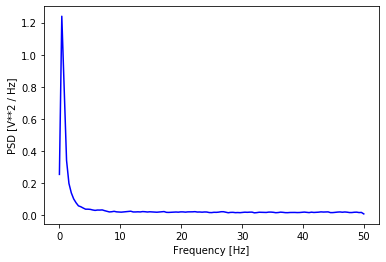

In [24]:
from scipy.signal import welch

def get_psd_values(y_values, T, N, f_s):
    f_values, psd_values = welch(y_values, fs=f_s)
    return f_values, psd_values


t_n = 10
N = 1000
T = t_n / N
f_s = 1/T

f_values, psd_values = get_psd_values(data_train_1['sm_17'], T, N, f_s)

plt.plot(f_values, psd_values, linestyle='-', color='blue')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD [V**2 / Hz]')
plt.show()

In [174]:
def autocorr(x):
    result = np.correlate(x, x, mode='full')
    return result[len(result)//2:]

def get_autocorr_values(y_values, T, N, f_s):
    autocorr_values = autocorr(y_values)
    x_values = np.array([T * jj for jj in range(0, N)])
    return x_values, autocorr_values

t_n = 10
N = 1000
T = t_n / N
f_s = 1/T

t_values, autocorr_values = get_autocorr_values(data_train_1['sm_12'], T, N, f_s)


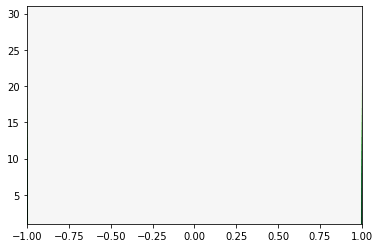

In [177]:
from scipy import signal
import matplotlib.pyplot as plt
t = np.linspace(-1, 1, 200, endpoint=False)
sig  = data_train_1['sm_12']
widths = np.arange(1, 31)
cwtmatr = signal.cwt(sig, signal.ricker, widths)
plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
plt.show()

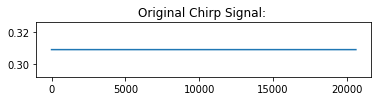

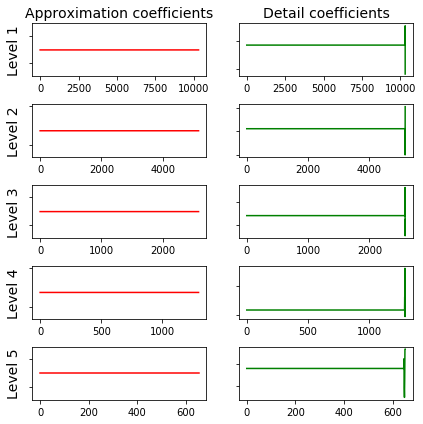

In [37]:
import pywt

x = data_train_1['sm_5']
chirp_signal = np.sin(250 * np.pi * x**2)
    
fig, ax = plt.subplots(figsize=(6,1))
ax.set_title("Original Chirp Signal: ")
ax.plot(chirp_signal)
plt.show()
    
data = chirp_signal
waveletname = 'sym5'

fig, axarr = plt.subplots(nrows=5, ncols=2, figsize=(6,6))
for ii in range(5):
    (data, coeff_d) = pywt.dwt(data, waveletname)
    axarr[ii, 0].plot(data, 'r')
    axarr[ii, 1].plot(coeff_d, 'g')
    axarr[ii, 0].set_ylabel("Level {}".format(ii + 1), fontsize=14, rotation=90)
    axarr[ii, 0].set_yticklabels([])
    if ii == 0:
        axarr[ii, 0].set_title("Approximation coefficients", fontsize=14)
        axarr[ii, 1].set_title("Detail coefficients", fontsize=14)
    axarr[ii, 1].set_yticklabels([])
plt.tight_layout()
plt.show()

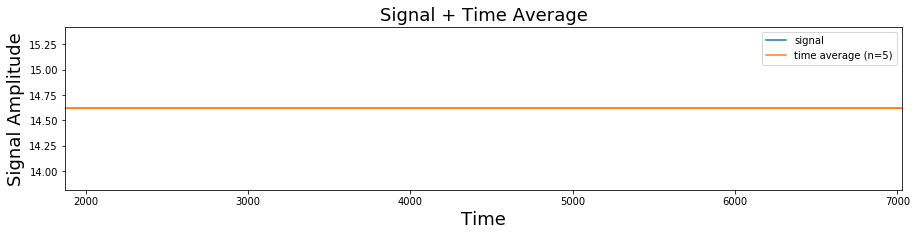

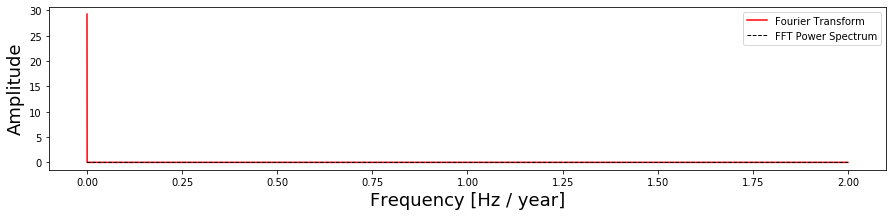

C:\Users\Amardeep\anaconda3\lib\site-packages\pywt\_cwt.py:117: FutureWarning:

Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).

C:\Users\Amardeep\anaconda3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning:

divide by zero encountered in log2



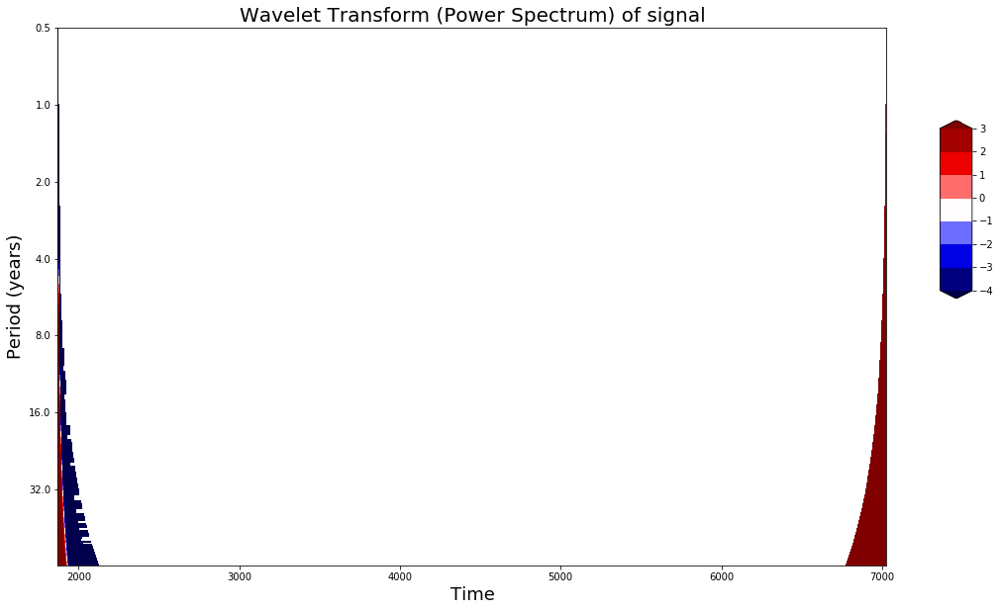

In [40]:
def get_ave_values(xvalues, yvalues, n = 5):
    signal_length = len(xvalues)
    if signal_length % n == 0:
        padding_length = 0
    else:
        padding_length = n - signal_length//n % n
    xarr = np.array(xvalues)
    yarr = np.array(yvalues)
    xarr.resize(signal_length//n, n)
    yarr.resize(signal_length//n, n)
    xarr_reshaped = xarr.reshape((-1,n))
    yarr_reshaped = yarr.reshape((-1,n))
    x_ave = xarr_reshaped[:,0]
    y_ave = np.nanmean(yarr_reshaped, axis=1)
    return x_ave, y_ave
def plot_wavelet(time, signal, scales, 
                 waveletname = 'cmor', 
                 cmap = plt.cm.seismic, 
                 title = 'Wavelet Transform (Power Spectrum) of signal', 
                 ylabel = 'Period (years)', 
                 xlabel = 'Time'):
    
    dt = time[1] - time[0]
    [coefficients, frequencies] = pywt.cwt(signal, scales, waveletname, dt)
    power = (abs(coefficients)) ** 2
    period = 1. / frequencies
    levels = [0.0625, 0.125, 0.25, 0.5, 1, 2, 4, 8]
    contourlevels = np.log2(levels)
    
    fig, ax = plt.subplots(figsize=(15, 10))
    im = ax.contourf(time, np.log2(period), np.log2(power), contourlevels, extend='both',cmap=cmap)
    
    ax.set_title(title, fontsize=20)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.set_xlabel(xlabel, fontsize=18)
    
    yticks = 2**np.arange(np.ceil(np.log2(period.min())), np.ceil(np.log2(period.max())))
    ax.set_yticks(np.log2(yticks))
    ax.set_yticklabels(yticks)
    ax.invert_yaxis()
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], -1)
    
    cbar_ax = fig.add_axes([0.95, 0.5, 0.03, 0.25])
    fig.colorbar(im, cax=cbar_ax, orientation="vertical")
    plt.show()

def plot_signal_plus_average(time, signal, average_over = 5):
    fig, ax = plt.subplots(figsize=(15, 3))
    time_ave, signal_ave = get_ave_values(time, signal, average_over)
    ax.plot(time, signal, label='signal')
    ax.plot(time_ave, signal_ave, label = 'time average (n={})'.format(5))
    ax.set_xlim([time[0], time[-1]])
    ax.set_ylabel('Signal Amplitude', fontsize=18)
    ax.set_title('Signal + Time Average', fontsize=18)
    ax.set_xlabel('Time', fontsize=18)
    ax.legend()
    plt.show()
    
def get_fft_values(y_values, T, N, f_s):
    f_values = np.linspace(0.0, 1.0/(2.0*T), N//2)
    fft_values_ = fft(y_values)
    fft_values = 2.0/N * np.abs(fft_values_[0:N//2])
    return f_values, fft_values

def plot_fft_plus_power(time, signal):
    dt = time[1] - time[0]
    N = len(signal)
    fs = 1/dt
    
    fig, ax = plt.subplots(figsize=(15, 3))
    variance = np.std(signal)**2
    f_values, fft_values = get_fft_values(signal, dt, N, fs)
    fft_power = variance * abs(fft_values) ** 2     # FFT power spectrum
    ax.plot(f_values, fft_values, 'r-', label='Fourier Transform')
    ax.plot(f_values, fft_power, 'k--', linewidth=1, label='FFT Power Spectrum')
    ax.set_xlabel('Frequency [Hz / year]', fontsize=18)
    ax.set_ylabel('Amplitude', fontsize=18)
    ax.legend()
    plt.show()

N = data_train_1.shape[0]
t0=1871
dt=0.25
time = np.arange(0, N) * dt + t0
scales = np.arange(1, 128)
plot_signal_plus_average(time, x)
plot_fft_plus_power(time, x)
plot_wavelet(time, x, scales)

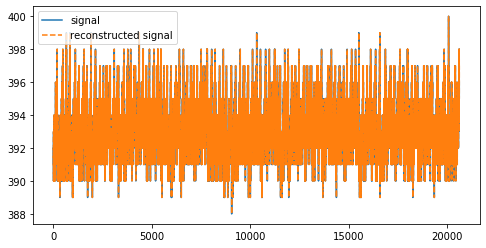

In [182]:
x = data_train_1['sm_17']
(cA1, cD1) = pywt.dwt(x, 'db2', 'smooth')
reconstructed_signal = pywt.idwt(cA1, cD1, 'db2', 'smooth')

fig, ax = plt.subplots(figsize=(8,4))
ax.plot(x, label='signal')
ax.plot(reconstructed_signal, label='reconstructed signal', linestyle='--')
ax.legend(loc='upper left')
plt.show()

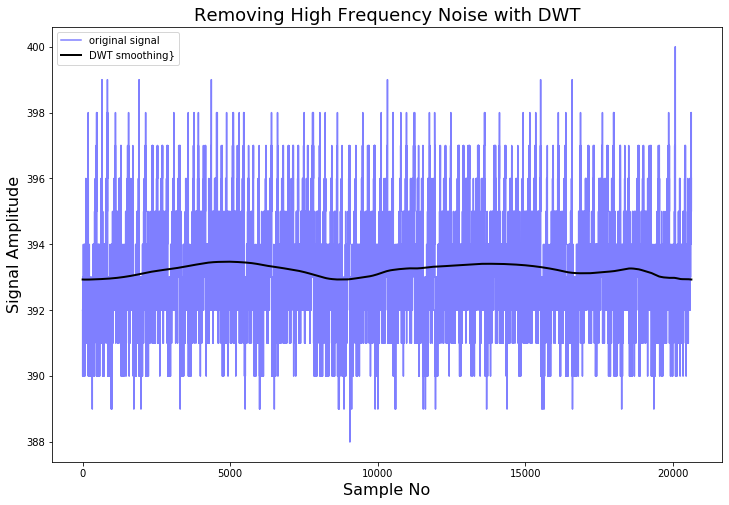

In [179]:
signal = data_train_1['sm_17']

def lowpassfilter(signal, thresh = 0.63, wavelet="db4"):
    thresh = thresh*np.nanmax(signal)
    coeff = pywt.wavedec(signal, wavelet, mode="per" )
    coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[1:])
    reconstructed_signal = pywt.waverec(coeff, wavelet, mode="per" )
    return reconstructed_signal

fig, ax = plt.subplots(figsize=(12,8))
ax.plot(signal, color="b", alpha=0.5, label='original signal')
rec = lowpassfilter(signal, 0.4)
ax.plot(rec, 'k', label='DWT smoothing}', linewidth=2)
ax.legend()
ax.set_title('Removing High Frequency Noise with DWT', fontsize=18)
ax.set_ylabel('Signal Amplitude', fontsize=16)
ax.set_xlabel('Sample No', fontsize=16)
plt.show()

## <font color='blue'><font color='blue'><u>Data Uploading & Importing Initial Packages</u></font></font>

In [1]:
import numpy as np
import pandas as pd

In [2]:
# Importing and parsing Dataset 1
# Data Set:- FD001
# Train trjectories:- 100
# Test trajectories:- 100
# Conditions:- ONE (Sea Level)
# Fault Modes:- ONE (HPC Degradation)
import pandas as pd
import numpy as np
data_train_1 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/train_FD001.txt', delimiter=' ', header=None)
data_train_1.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_train_1=data_train_1.drop(columns=['sm_22','sm_23'])

In [3]:
data_test_1 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/test_FD001.txt', sep=" ", header=None)
data_test_1.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_test_1=data_test_1.drop(columns=['sm_22','sm_23'])

In [99]:
# Importing and parsing Dataset 2
# Data Set:- FD002
# Train trjectories:- 260
# Test trajectories:- 259
# Conditions:- SIX
# Fault Modes:- ONE (HPC Degradation)
data_train_2 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/train_FD002.txt', sep=" ", header=None)
data_train_2.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_train_2=data_train_2.drop(columns=['sm_22','sm_23'])

In [100]:
data_test_2 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/test_FD002.txt', sep=" ", header=None)
data_test_2.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_test_2=data_test_2.drop(columns=['sm_22','sm_23'])

In [101]:
# Importing and parsing Dataset 3
# Data Set:- FD003
# Train trjectories:- 100
# Test trajectories:- 100
# Conditions:- ONE (Sea Level)
# Fault Modes:- TWO (HPC Degradation, Fan Degradation)
data_train_3 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/train_FD003.txt', sep=" ", header=None)
data_train_3.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_train3=data_train_3.drop(columns=['sm_22','sm_23'])

In [102]:
data_test_3 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/test_FD003.txt', sep=" ", header=None)
data_test_3.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_test_3=data_test_3.drop(columns=['sm_22','sm_23'])

In [103]:
# Importing and parsing Dataset 4
# Data Set:- FD004
# Train trjectories:- 248
# Test trajectories:- 249
# Conditions:- SIX
# Fault Modes:- TWO (HPC Degradation, Fan Degradation)
data_train_4 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/train_FD004.txt', sep=" ", header=None)
data_train_4.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_train_4=data_train_4.drop(columns=['sm_22','sm_23'])

In [104]:
data_test_4 = pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/test_FD004.txt', sep=" ", header=None)
data_test_4.columns = ["unit number", "time_cycles", "op_set_1", "op_set_2","op_set_3","sm_1","sm_2","sm_3","sm_4","sm_5","sm_6","sm_7","sm_8","sm_9","sm_10","sm_11","sm_12","sm_13","sm_14","sm_15","sm_16","sm_17","sm_18","sm_19","sm_20","sm_21","sm_22","sm_23"]
data_test_4=data_test_4.drop(columns=['sm_22','sm_23'])

In [4]:
#Importing RULs for all datasets
RUL_1=pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/RUL_FD001.txt', sep=" ", header=None)
RUL_1.columns = ["RUL","d"]
RUL_1=RUL_1.drop(columns=['d'])
RUL_2=pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/RUL_FD002.txt', sep=" ", header=None)
RUL_2.columns = ["RUL","d"]
RUL_2=RUL_2.drop(columns=['d'])
RUL_3=pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/RUL_FD003.txt', sep=" ", header=None)
RUL_3.columns = ["RUL","d"]
RUL_3=RUL_3.drop(columns=['d'])
RUL_4=pd.read_csv('C:/Users/Amardeep/Downloads/ML Nanodegree/PROJECT3/CMAPSSData/RUL_FD004.txt', sep=" ", header=None)
RUL_4.columns = ["RUL","d"]
RUL_4=RUL_4.drop(columns=['d'])

In [5]:
#Make new column for RUL to match it with the test dataframe.
RUL_1['unit number']= 1+RUL_1['RUL'].index.values
#Merging common columns based on unit number.
data_test_1=pd.merge(data_test_1, RUL_1, on='unit number')

In [6]:
#Define a function to create RUL values for the training set.
def create_RUL(data, factor = 0):
    df = data.copy()
    RUL = df.groupby('unit number')['time_cycles'].max().reset_index()
    RUL = pd.DataFrame(RUL)
    RUL.columns = ['unit number','max']
    df = df.merge(RUL, on=['unit number'], how='left')
    df['RUL'] = df['max'] - df['time_cycles']
    df.drop(columns=['max'],inplace = True)
    
    return df[df['time_cycles'] > factor]

In [7]:
df_train= create_RUL(data_train_1)

## Exploratory Data Analysis

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import rcParams

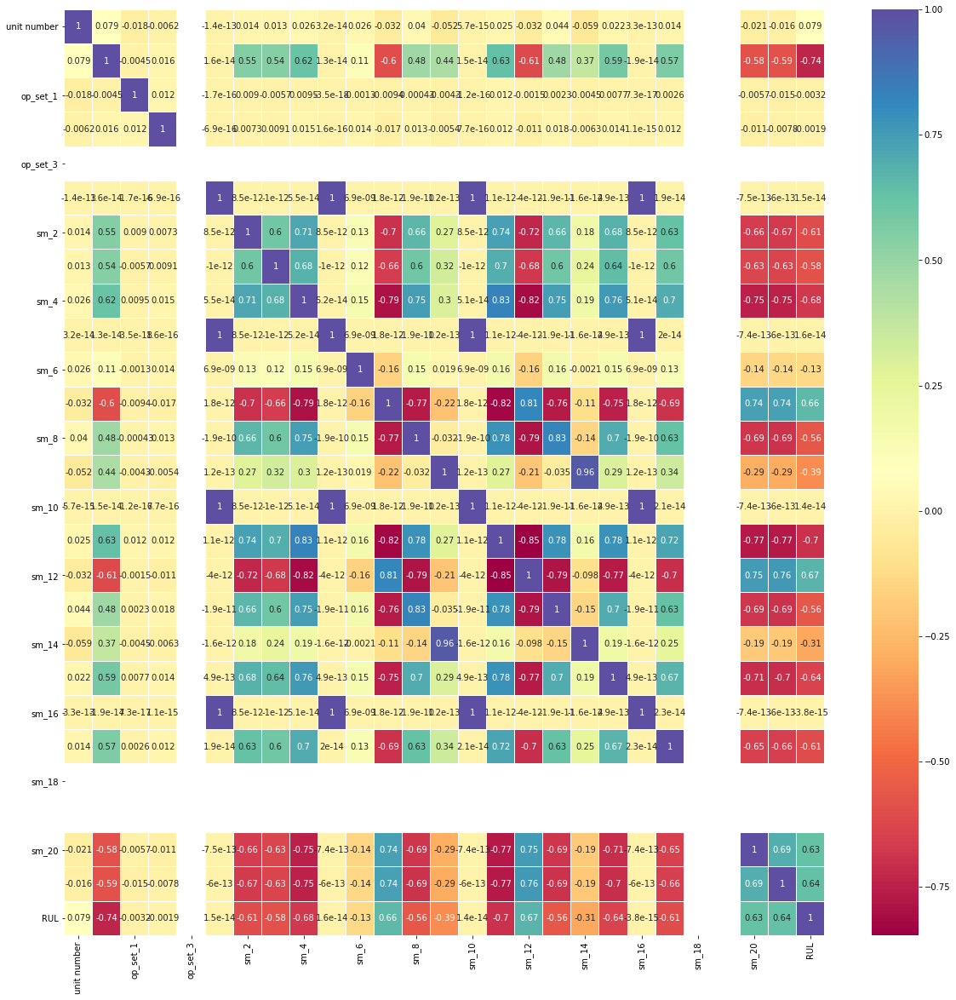

In [14]:
sns.heatmap(dftr_1.corr(),annot=True,cmap='Spectral',linewidths=0.01)
fig=plt.gcf()
fig.set_size_inches(20,20)
plt.show()

In [50]:
dftr_1

,unit number,time_cycles,op_set_1,op_set_2,op_set_3,sm_1,sm_2,sm_3,sm_4,sm_5,...,sm_13,sm_14,sm_15,sm_16,sm_17,sm_18,sm_19,sm_20,sm_21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,1


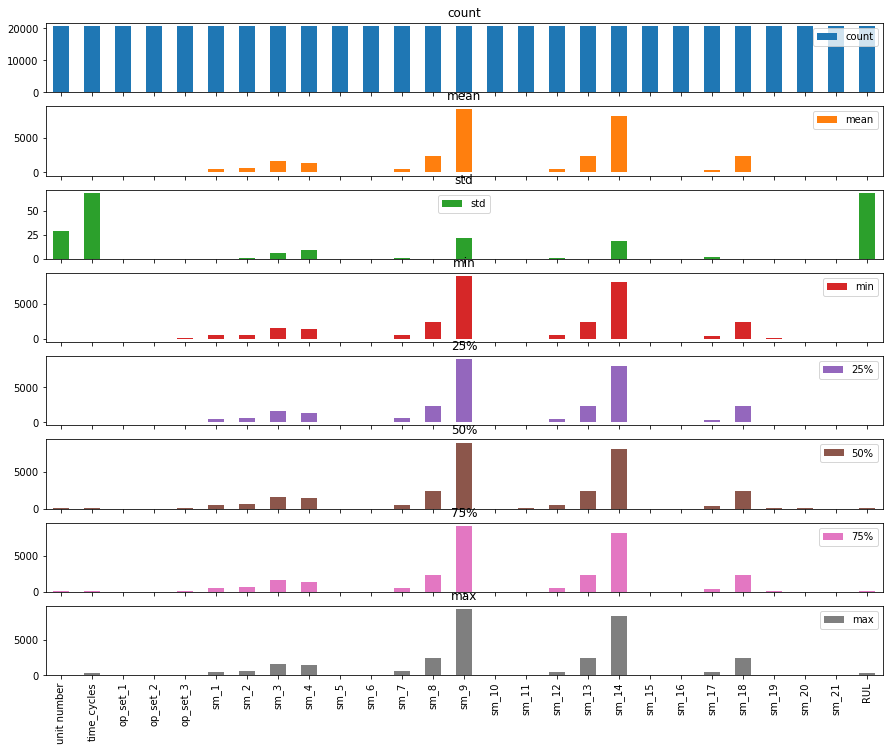

In [58]:
# plot an overview of whats going on in the columns
axes = dftr_1.describe().T.plot.bar(subplots=True, figsize=(15,12))

In [18]:
# get the time of the last available measurement for each unit
mapper = {}
for unitnumber in dftr_1['unit number'].unique():
    mapper[unitnumber] = dftr_1['time_cycles'].loc[dftr_1['unit number'] == unitnumber].max()
    
# calculate RUL = time.max() - time_now for each unit
dftr_1['RUL'] = dftr_1['unit number'].apply(lambda nr: mapper[nr]) - dftr_1['time_cycles']

In [21]:
cols_nan = dftr_1.columns[dftr_1.isna().any()].tolist()
print('Columns with all nan: \n' + str(cols_nan) + '\n')

cols_const = [ col for col in dftr_1.columns if len(dftr_1[col].unique()) <= 2 ]
print('Columns with all const values: \n' + str(cols_const) + '\n')

Columns with all nan: 
[]

Columns with all const values: 
['op_set_3', 'sm_1', 'sm_5', 'sm_6', 'sm_10', 'sm_16', 'sm_18', 'sm_19']



In [22]:
dftr_1 = dftr_1.drop(columns=cols_const + cols_nan)


In [24]:
for nr, df_temp in df_1.groupby('unit number'):
    cols_nan = df_1.columns[df_temp.isna().any()].tolist()
    cols_const = [ col for col in df_temp.columns if len(df_temp[col].unique()) <= 2 and col != 'unit_nr' ]
    if cols_nan or cols_const:
        print('Unit nr: {} has columns with all nan or const: \n {}'.format(nr, cols_nan + cols_const))
        
print('scanned all')

Unit nr: 1 has columns with all nan or const: 
 ['unit number']
Unit nr: 2 has columns with all nan or const: 
 ['unit number']
Unit nr: 3 has columns with all nan or const: 
 ['unit number']
Unit nr: 4 has columns with all nan or const: 
 ['unit number']
Unit nr: 5 has columns with all nan or const: 
 ['unit number']
Unit nr: 6 has columns with all nan or const: 
 ['unit number']
Unit nr: 7 has columns with all nan or const: 
 ['unit number']
Unit nr: 8 has columns with all nan or const: 
 ['unit number']
Unit nr: 9 has columns with all nan or const: 
 ['unit number']
Unit nr: 10 has columns with all nan or const: 
 ['unit number']
Unit nr: 11 has columns with all nan or const: 
 ['unit number']
Unit nr: 12 has columns with all nan or const: 
 ['unit number']
Unit nr: 13 has columns with all nan or const: 
 ['unit number']
Unit nr: 14 has columns with all nan or const: 
 ['unit number']
Unit nr: 15 has columns with all nan or const: 
 ['unit number']
Unit nr: 16 has columns with all n

In [27]:
#Finding strongest correlation between all signals
df_sub = dftr_1.copy()
del df_sub['unit number']
del df_sub['RUL']

df_sub.set_index('time_cycles', inplace=True)
df_sub.dropna(axis=1, how='all', inplace=True)

df_corr = df_sub.corr(method='pearson')
df_corr2 = pd.DataFrame(np.tril(df_corr.values), columns=df_corr.columns, index = df_corr.index)

correlating = []
for col in df_corr2.columns:
    ser = df_corr2[col]
    idx = np.logical_or(-0.8 > ser,  ser > 0.8)
    for i, c in zip(ser[idx].index, ser[idx].values):
        if (i, col, c) not in correlating and i != col:
            correlating.append((col, i, c))

print('highly correlating measurements:')
for c in correlating:
    print(c)

highly correlating measurements:
('sm_4', 'sm_11', 0.8301356963159666)
('sm_4', 'sm_12', -0.8155905161052416)
('sm_7', 'sm_11', -0.8228050249957727)
('sm_7', 'sm_12', 0.8127126013254434)
('sm_8', 'sm_13', 0.8260843322358152)
('sm_9', 'sm_14', 0.9631566003059564)
('sm_11', 'sm_12', -0.8468835930051064)


In [29]:
def exclude_trivial(df_sub):
    cols = []
    for col in df_sub.columns:
        if col == 'unit number':
            continue
        elif col == 'RUL':
            continue
        elif len(df_sub[col].unique()) <= 2:
            continue
        else:
            cols.append(col)
            
    return df_sub[cols].copy()

def get_data_non_trivial(df, unit_nr, ):
    df_sub = df.loc[df['unit number'] == unit_nr].copy()
    df_sub.set_index('time_cycles', inplace=True)
    df_sub.dropna(axis=1, how='all', inplace=True)
    
    df_sub = exclude_trivial(df_sub)
    return df_sub


def get_data_by_cols_and_unit(df, unit_nr, cols):
    df_sub = df.loc[df['unit number'] == unit_nr].copy()
    df_sub.set_index('time_cycles', inplace=True)
    df_sub.dropna(axis=1, how='all', inplace=True)
    
    df_sub = df_sub[cols]
    return df_sub


def plot_ts_by_unit(df, unit_nr, wind_size):
    '''plot all non trivial measurements and states'''
    df_sub = get_data_non_trivial(df, unit_nr)
    cols = df_sub.columns
    fig, axes = plt.subplots(len(cols), 1, figsize=(15,12))
    
    for col, ax in zip(cols, axes):
        df_sub[col].plot(ax = ax)
        df_sub[col].rolling(wind_size).median().plot(ax = ax)
        df_sub[col].rolling(wind_size).mean().plot(style = '--', legend=True, ax = ax)
    fig.suptitle('unit NR: {}'.format(unit_nr))

def plot_hist_by_unit(df, unit_nr, wind_size):
    df_sub = get_data_non_trivial(df, unit_nr)
    cols = df_sub.columns
    n_cols = min(len(cols), 5)
    n_rows = int(np.ceil(len(cols) / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15,12))
    axes = axes.flatten()
    for col, ax in zip(cols, axes):
        sns.distplot(df_sub[[col]], ax=ax, label=col)
        labels(col, "p", ax)
    fig.suptitle('unit NR: {}'.format(unit_nr))

In [30]:
mapper_by_length = sorted(mapper.items(), key=lambda kv: kv[1])
wind_size = 20

In [33]:

sns.set() 
def labels(x, y, *axes):
    for axis in axes:
        if x: axis.set_xlabel(x)
        if y: axis.set_ylabel(y)

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[t

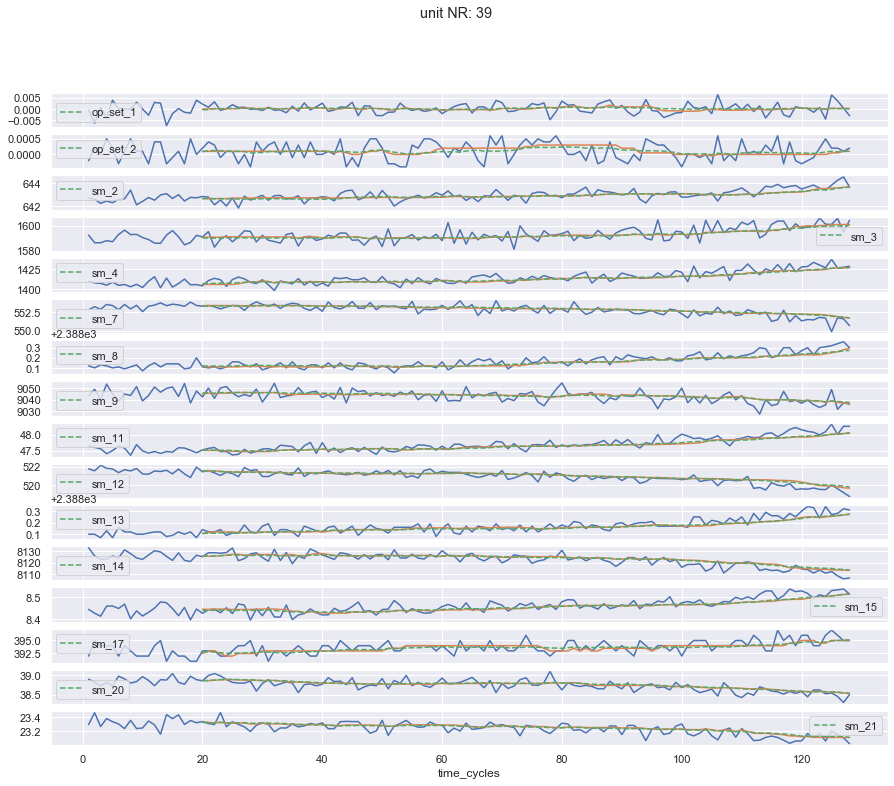

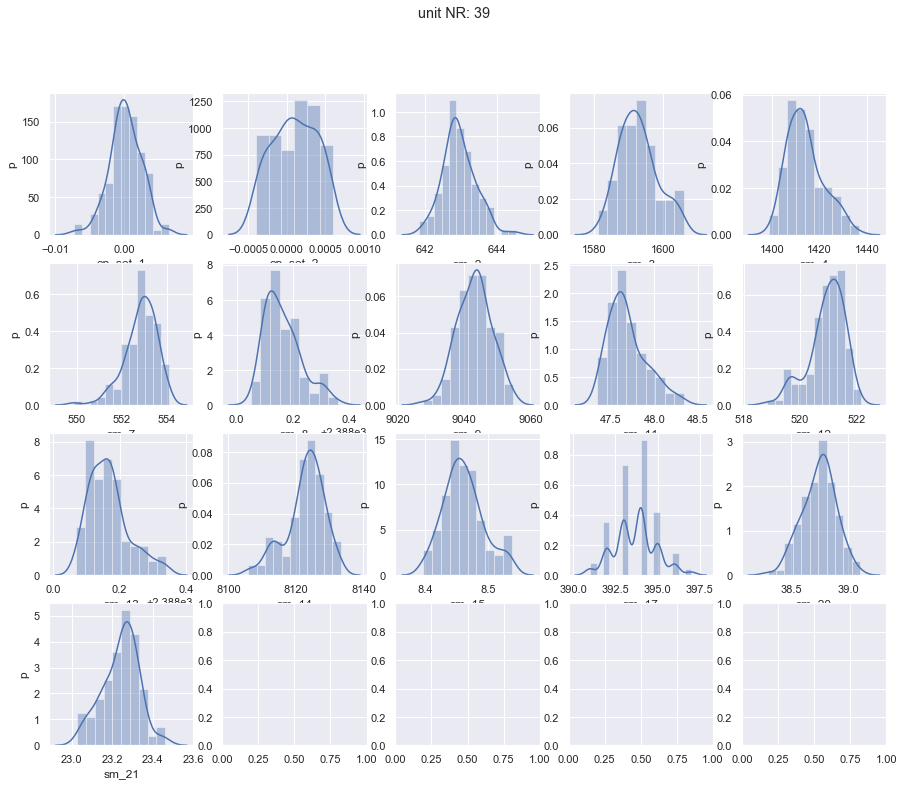

In [34]:
# plot shortes operating machine data
unit_to_plot = mapper_by_length[0][0]
plot_ts_by_unit(df_1, unit_to_plot, wind_size)
plot_hist_by_unit(df_1, unit_to_plot, wind_size)

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[t

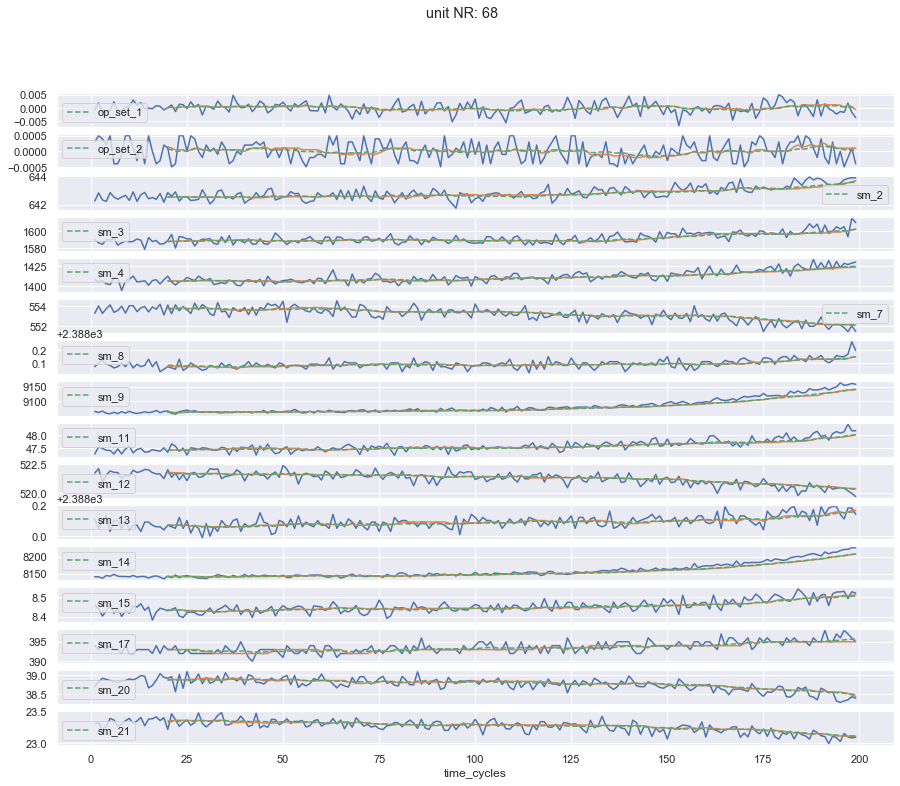

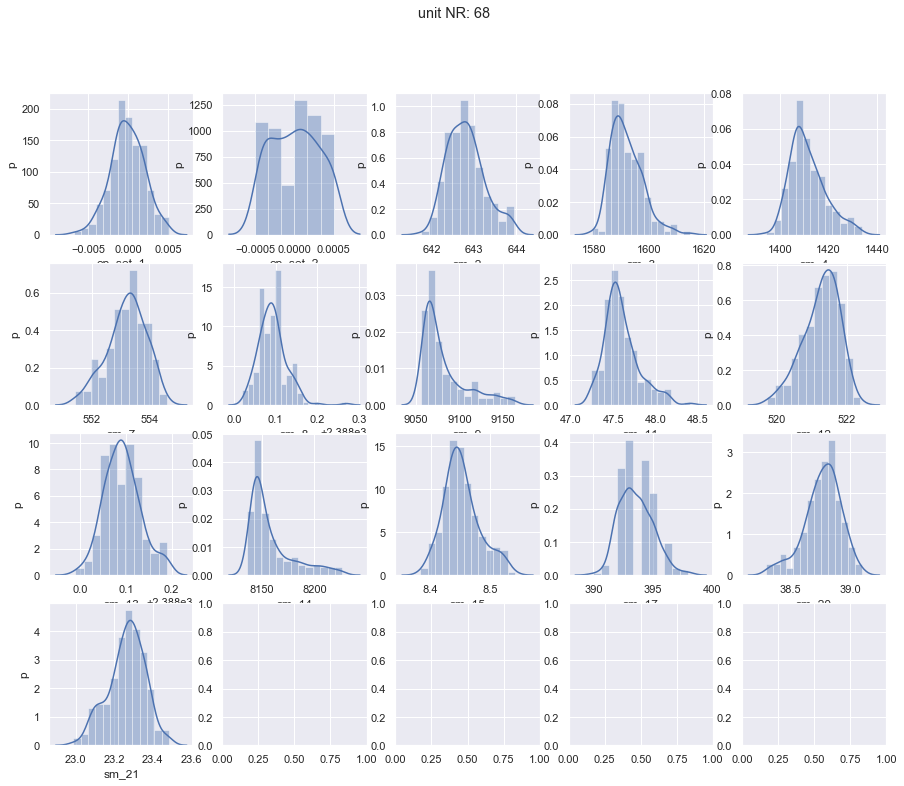

In [35]:
# plot medium time operating machine data
unit_to_plot = mapper_by_length[int(len(mapper)/2)][0]
plot_ts_by_unit(df_1, unit_to_plot, wind_size)
plot_hist_by_unit(df_1, unit_to_plot, wind_size)

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[t

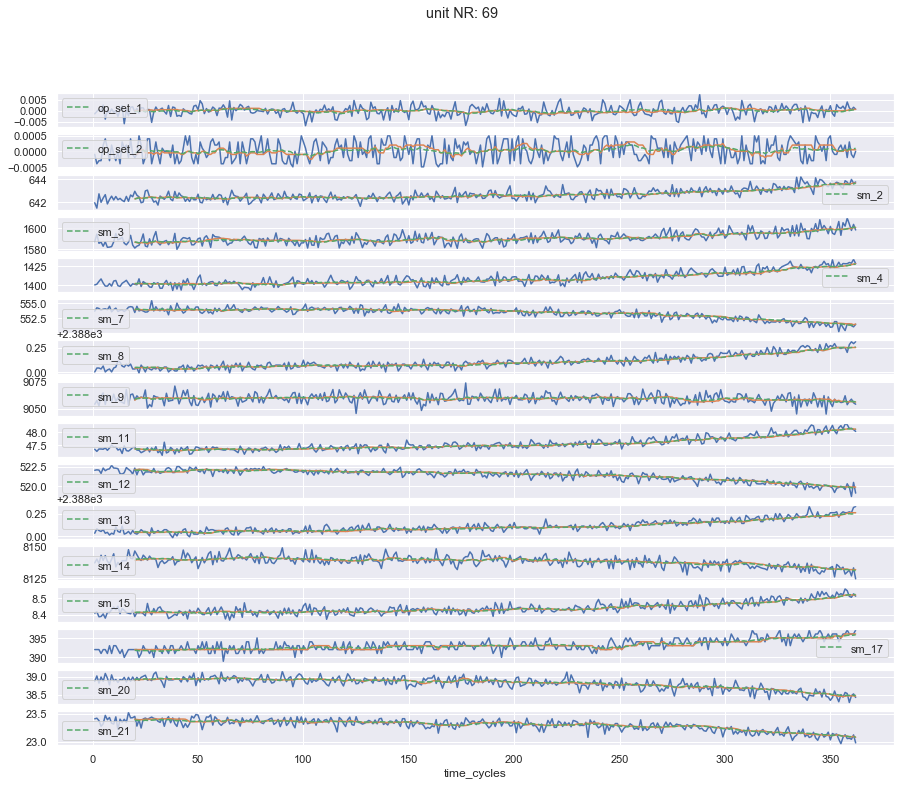

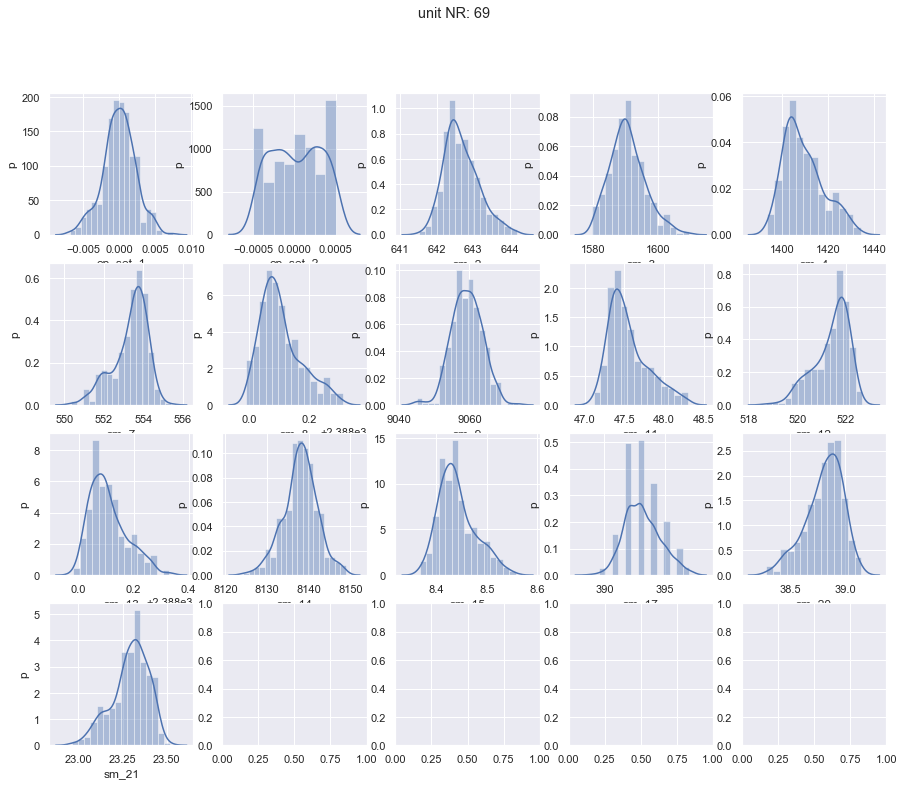

In [36]:
# plot longest operating machine data
unit_to_plot = mapper_by_length[-1][0]
plot_ts_by_unit(df_1, unit_to_plot, wind_size)
plot_hist_by_unit(df_1, unit_to_plot, wind_size)

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[t

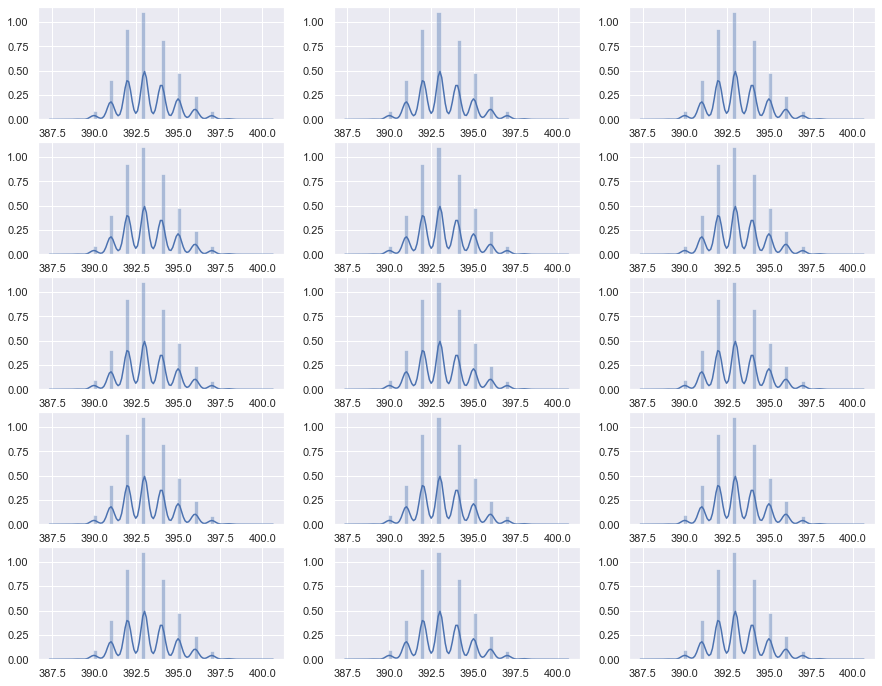

In [41]:
n_units = 15 # limit to X different units to make it easier to handle
import random
dfs = [df_1 for nr, df in df_1.groupby('unit number')]
smpls = random.sample(dfs, 15)
fig, axes = plt.subplots(5, 3, figsize=(15,12))
axes = axes.flatten()
for df_now, ax in zip(dfs, axes):
    sns.distplot(df_now[['sm_17']], ax=ax)

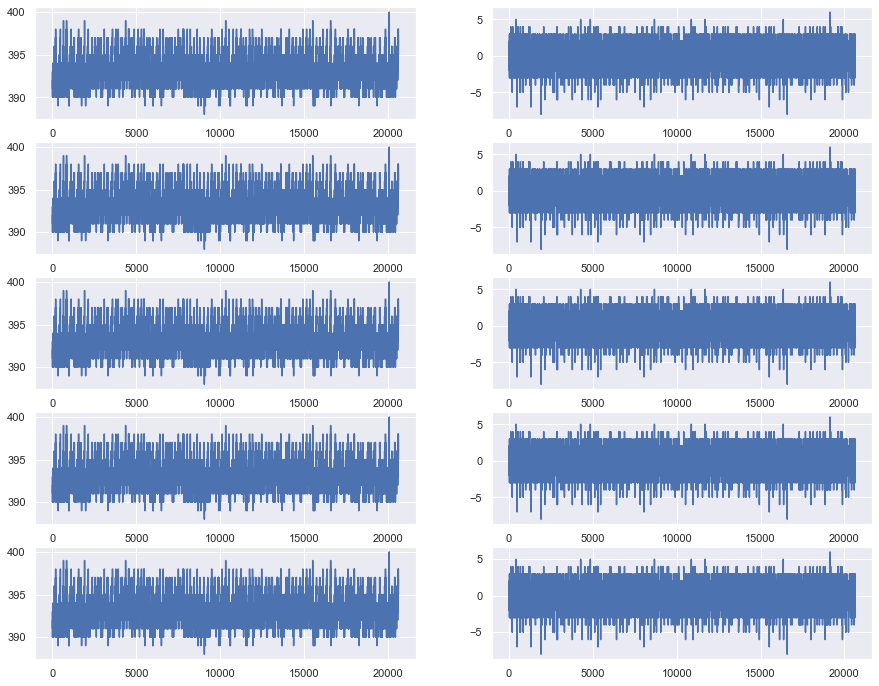

In [39]:
fig, axes = plt.subplots(5, 2, figsize=(15,12))
cnt = 0
for df_now, ax in zip(dfs, range(5)):
    ser = df_now['sm_17']
    axes[cnt, 0].plot(ser.values)
    axes[cnt, 1].plot(ser.diff().values)
    cnt += 1

In [43]:
step_sizes = []
for nr, df_local in df_1.groupby('unit number'):
    step_sizes += list(set(df_local['sm_17'].unique()))
step_sizes = set(step_sizes)
print(step_sizes)

{388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400}


In [45]:
#Split dataframe by units
dfs_by_unit = {}

RULs_max = {}
for unit_nr in df_1['unit number'].unique():
    dfs_by_unit[unit_nr] = df_1.loc[df_1['unit number'] == unit_nr].copy()

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


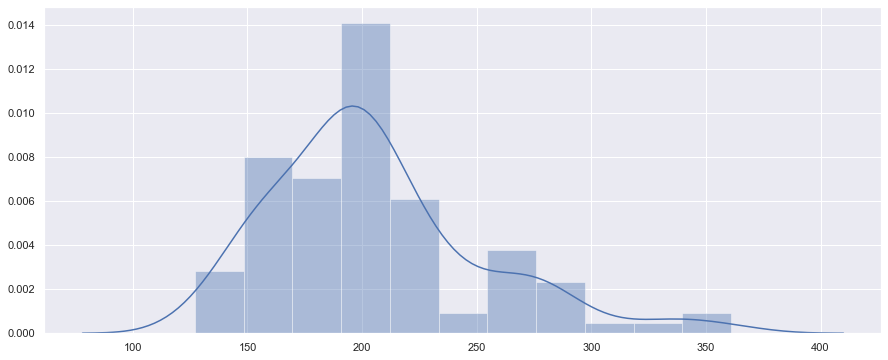

In [46]:
RULs_max = dict([(nr, v['RUL'].values[0]) for nr, v in df_1.groupby('unit number')]) 
fig = plt.figure(figsize=(15, 6))
ax2 = sns.distplot(pd.Series(RULs_max) ,label='operation times')

In [52]:
#Visualize the state transition combined for all units
def plot_grouped_by_RUL(df_sub, leg=True):

    cols = [col for col in df_sub.columns if len(df_sub[col].unique()) > 2]
    cols_data = [col for col in cols if col.startswith('sm') or col.startswith('op')]

    g = sns.PairGrid(data=df_sub, x_vars="RUL", y_vars=cols_data,hue="unit number", height=2, aspect=6,)
    g = g.map(plt.plot, alpha=0.5)
    g = g.set(xlim=(df_sub['RUL'].max(),df_sub['RUL'].min()))
    if leg:
        g = g.add_legend()

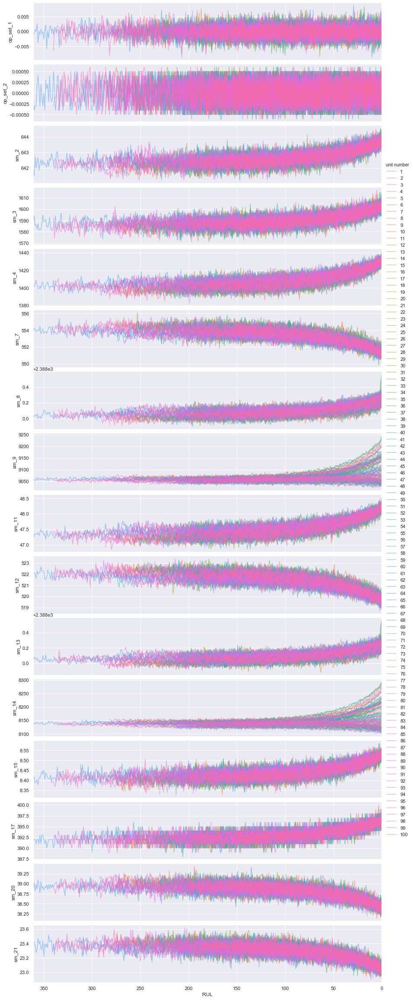

In [53]:
#In absolut RUL timeline
cols = [col for col in df_1.columns if len(df_1[col].unique()) > 2]
cols_data = [col for col in cols if col.startswith('sm') or col.startswith('op')]

plot_grouped_by_RUL(df_1[cols].copy())

In [59]:
!pip install ProcessingHelpers 

ERROR: Could not find a version that satisfies the requirement ProcessingHelpers (from versions: none)
ERROR: No matching distribution found for ProcessingHelpers


In [57]:
from ProcessingHelpers import normalize_col_by_unit


ModuleNotFoundError: No module named 'ProcessingHelpers'

In [ ]:
!pip install PlottingHelpers

In [203]:
#Importing All major The Necessary Packages
import numpy as np
import pandas as pd
from pandas import DataFrame,Series
from sklearn.decomposition import PCA
import  matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler 

In [61]:
#Scaling the bin and obtaining the scores for the pca analysis.
E=df_1
E.set_index('RUL', inplace=True)
E_index=E.index
E= StandardScaler().fit_transform(E)
pca = PCA(n_components=3, svd_solver='full')
PC_scores = pca.fit_transform(E)
scores_pd = pd.DataFrame(data = PC_scores
                         ,columns = ['PC1', 'PC2', 'PC3']
                         ,index =E_index)

In [63]:
loadings_pd = pd.DataFrame(data = pca.components_.T
                           ,columns = ['PC1', 'PC2', 'PC3']
                           ,index = df_1.columns)

In [64]:
#PLotting the PCA plot fucntion
def myplot(scores,loadings,loading_labels=None,score_labels=None):
    # adjusting the scores to fit in (-1,1)
    xt = scores[:,0]
    yt = scores[:,1]
    n = loadings.shape[0]
    scalext = 1.0/(xt.max() - xt.min())
    scaleyt = 1.0/(yt.max() - yt.min())
    xt_scaled = xt * scalext
    yt_scaled = yt * scaleyt
    # adjusting the loadings to fit in (-1,1)
    p = loadings
    p_scaled = MaxAbsScaler().fit_transform(p)
    
    #plt.scatter(xs * scalex,ys * scaley, s=10)
    for (x,y), label in zip(np.vstack((xt_scaled, yt_scaled)).T,score_labels):
        plt.text(x, y, label, ha='center', size=11)
    
    for i in range(n):
        plt.arrow(0, 0, p_scaled[i,0], p_scaled[i,1], color = 'r',alpha = 0.5)
        if loading_labels is None:
            plt.text(p_scaled[i,0], p_scaled[i,1], "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(p_scaled[i,0], p_scaled[i,1], loading_labels[i], color = 'r', ha = 'center', va = 'center', size=16)
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1), fontsize=20);
    plt.ylabel("PC{}".format(2), fontsize=20);
    plt.tick_params(labelsize=16)
    plt.grid()

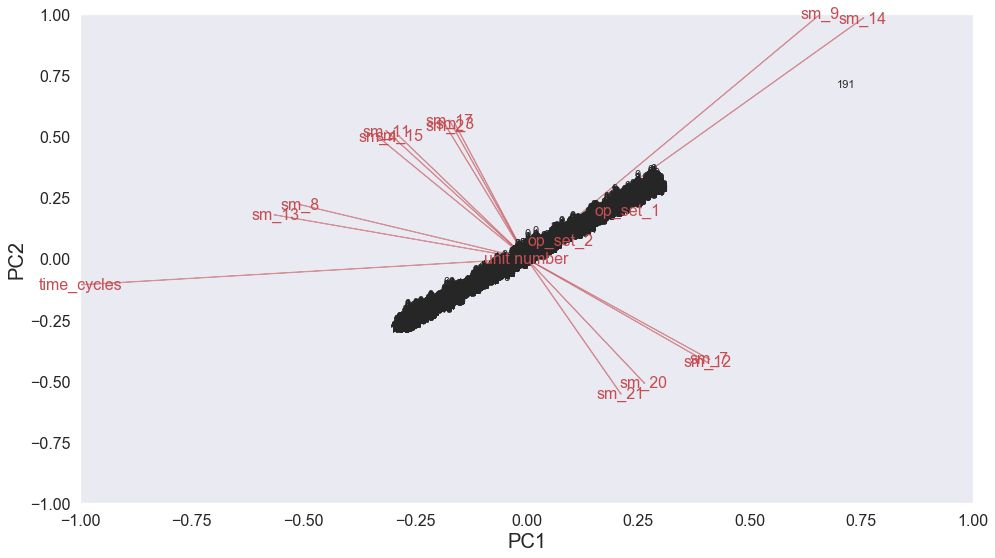

In [65]:
plt.rcParams["figure.figsize"] = [16,9]
myplot(PC_scores[:,:2],loadings_pd.iloc[:,:2],loading_labels=loadings_pd.index,score_labels=scores_pd.index)
plt.show()

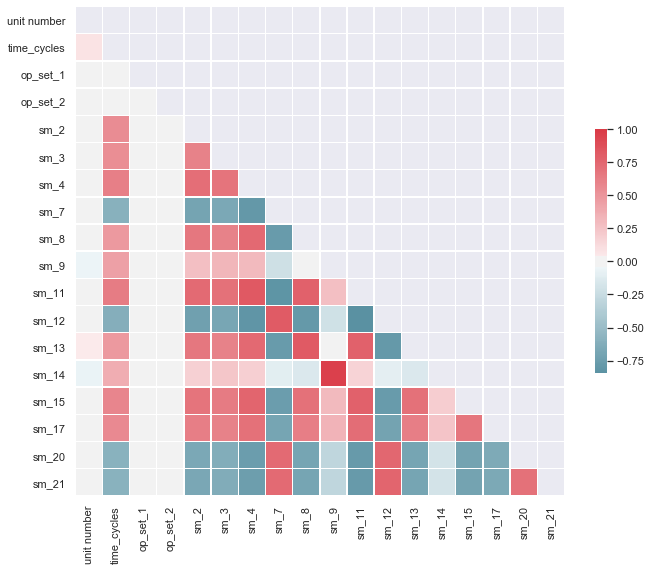

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

In [67]:
#Creating a correlation plot for the variables
import seaborn as sns
corr = df_1.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()
plt.figure(figsize=(50,50))

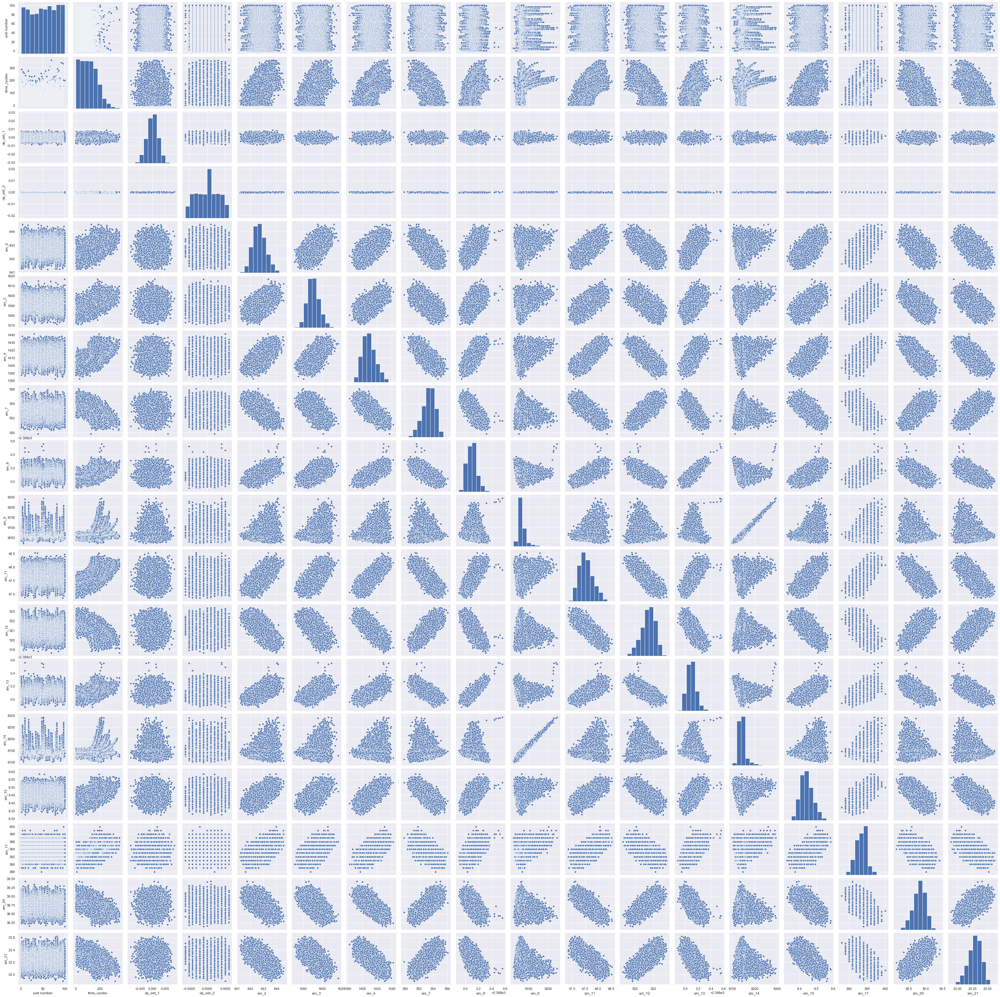

In [68]:
sns.pairplot(df_1)
plt.show()

In [71]:
#Performing PCA for 10 components
pca10 = PCA(n_components=10, svd_solver='full')
pca10.fit(df_1)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

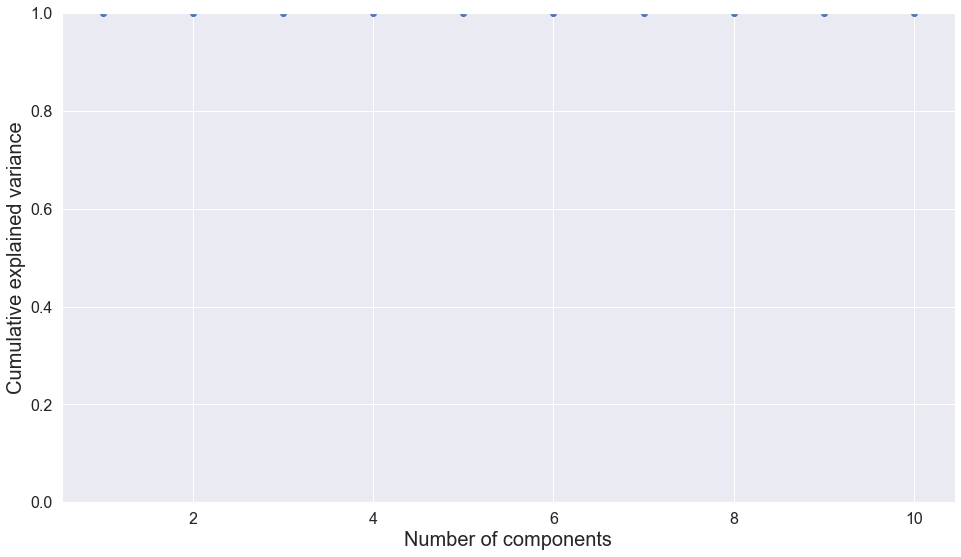

In [72]:
#Variance for components displayed in graph.
plt.plot(range(1,pca10.n_components+1), np.cumsum(pca10.explained_variance_ratio_),'-o')
plt.xlabel('Number of components', fontsize=20)
plt.ylabel('Cumulative explained variance', fontsize=20);
plt.tick_params(labelsize=16)
plt.ylim(0,1)

plt.show()

### On Dataset FD002 

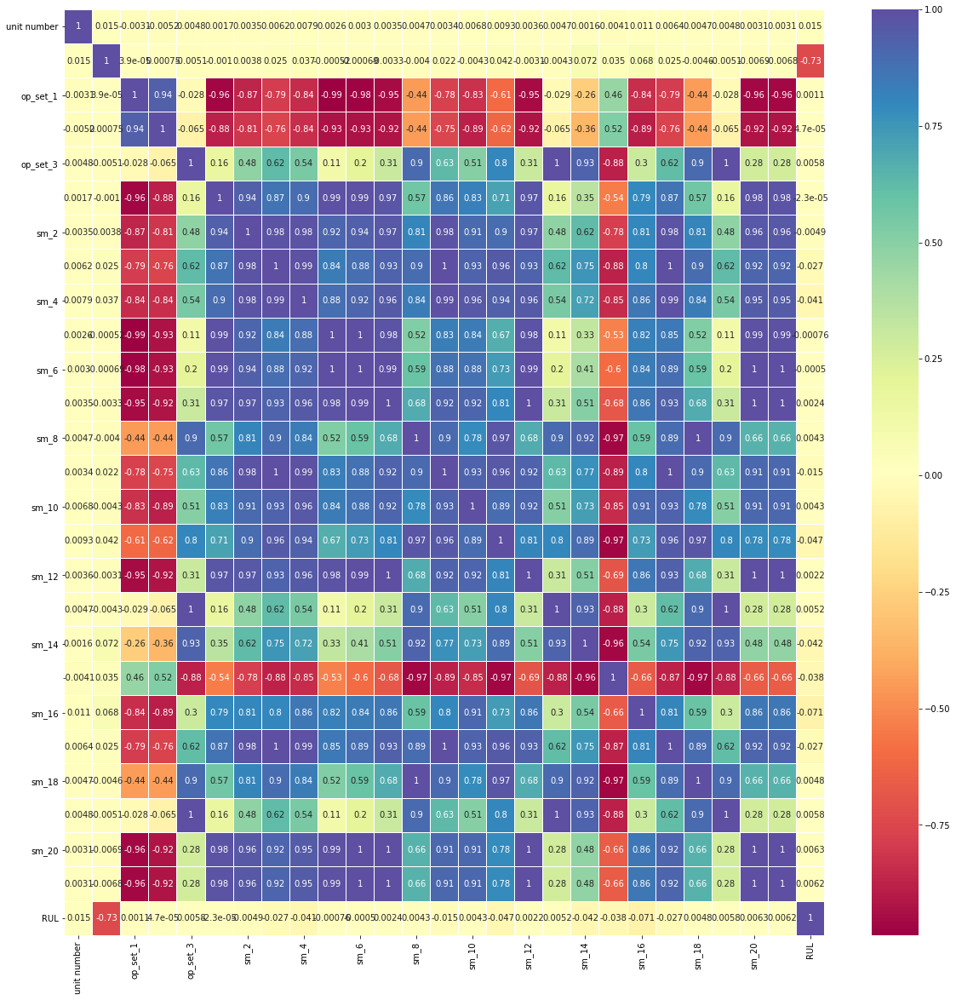

In [80]:
sns.heatmap(df_2.corr(),annot=True,cmap='Spectral',linewidths=0.01)
fig=plt.gcf()
fig.set_size_inches(20,20)
plt.show()

### On Dataset FD003

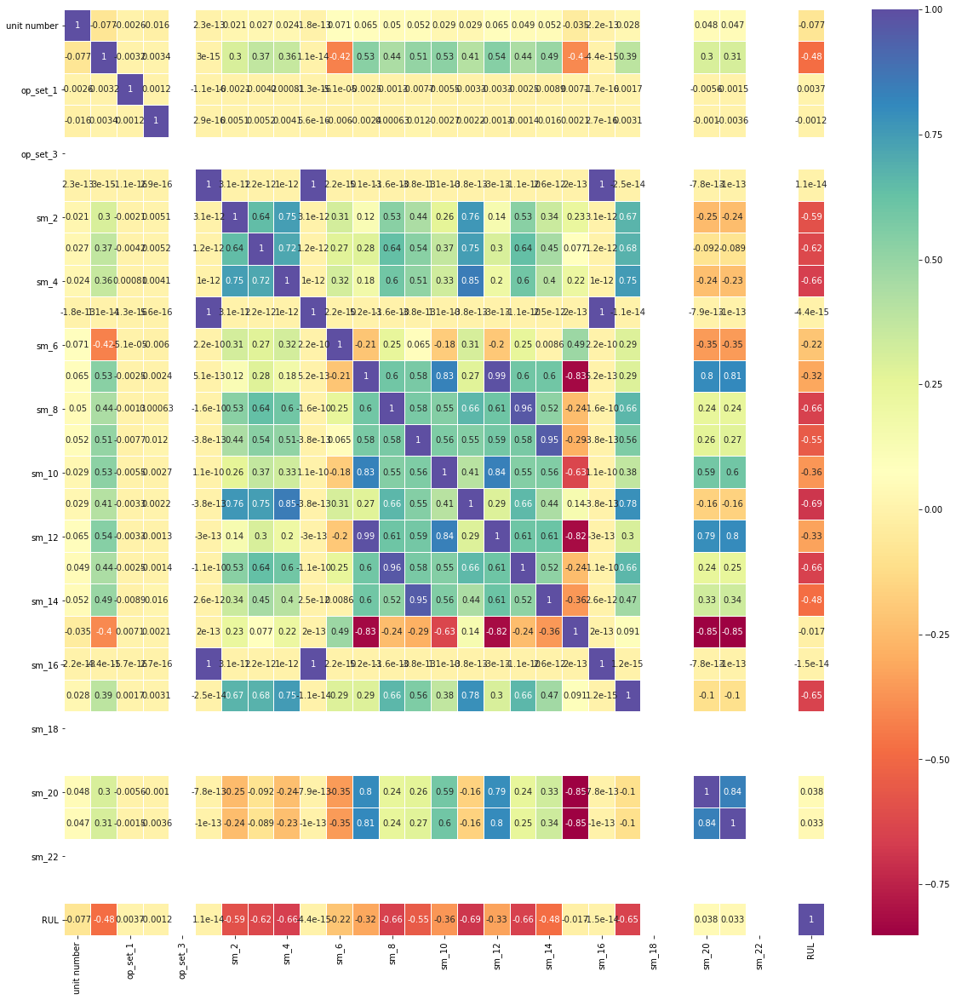

In [82]:
sns.heatmap(df_3.corr(),annot=True,cmap='Spectral',linewidths=0.01)
fig=plt.gcf()
fig.set_size_inches(20,20)
plt.show()

### On Dataset FD004

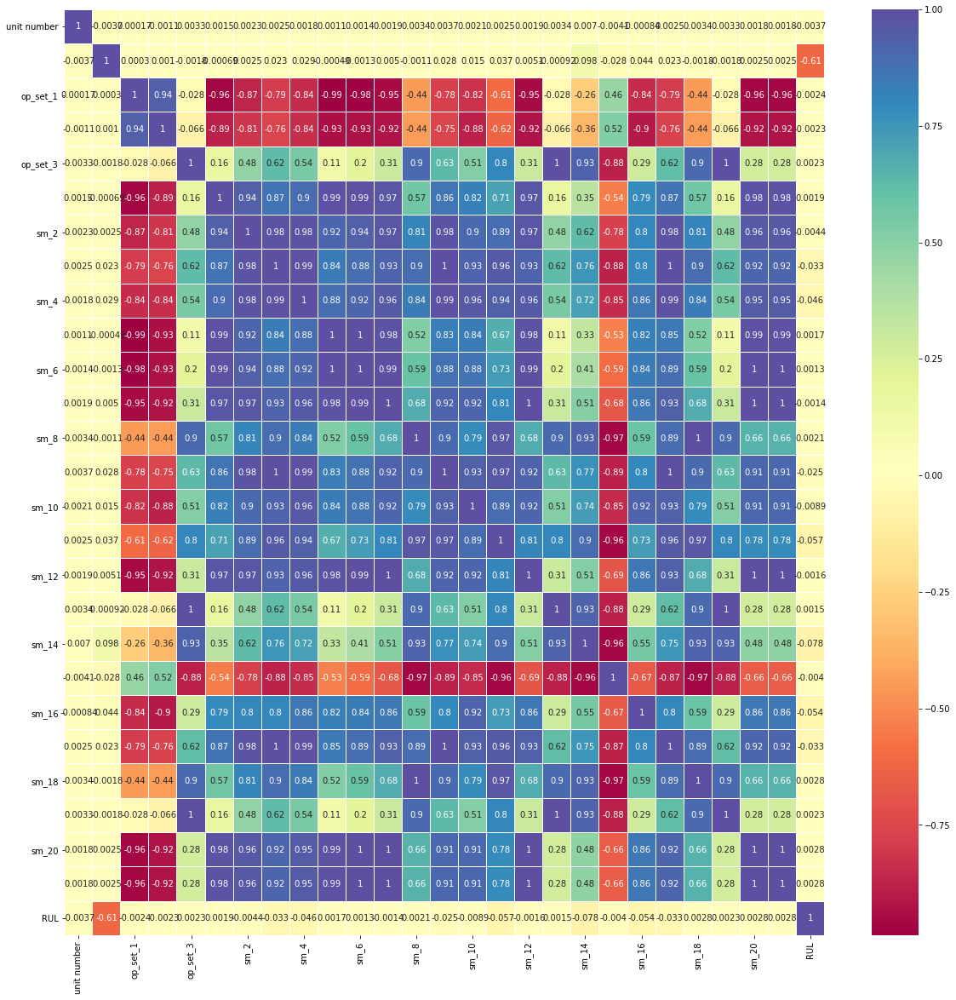

In [84]:
sns.heatmap(df_4.corr(),annot=True,cmap='Spectral',linewidths=0.01)
fig=plt.gcf()
fig.set_size_inches(20,20)
plt.show()

## Conventional Model Building Using Regression

### For Dataset FD001

In [75]:
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn.metrics import mean_squared_error

In [13]:
y=df_1['RUL']
X=df_1.drop(columns=['RUL'])

In [14]:
df_1

,unit number,time_cycles,op_set_1,op_set_2,op_set_3,sm_1,sm_2,sm_3,sm_4,sm_5,...,sm_13,sm_14,sm_15,sm_16,sm_17,sm_18,sm_19,sm_20,sm_21,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,1


In [78]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [80]:
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [81]:
xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

[11:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[11:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


In [82]:
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 62.517756


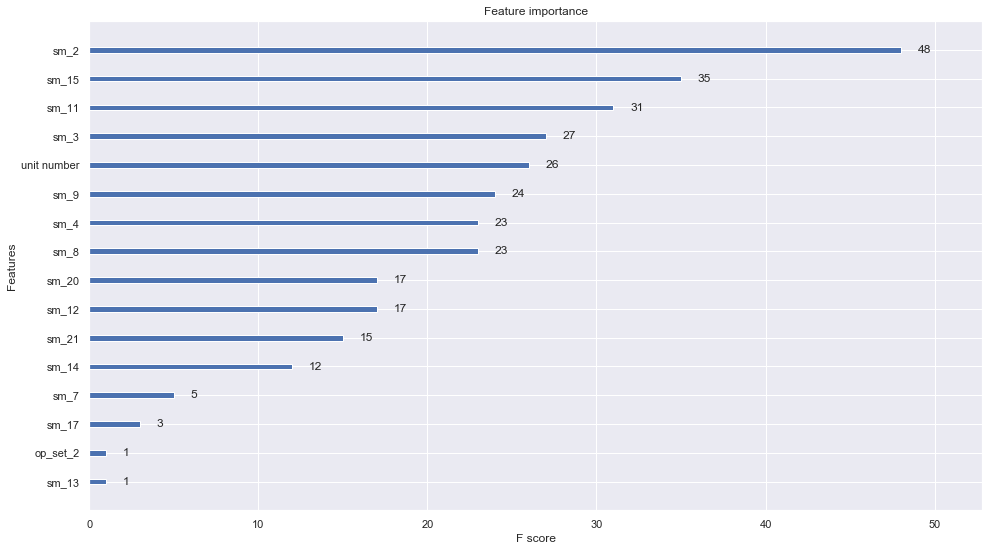

In [83]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

In [84]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, random_state=123)
xg1 = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)
xg1.fit(X_train,y_train)

preds = xg1.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))


[11:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[11:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
RMSE: 60.486288


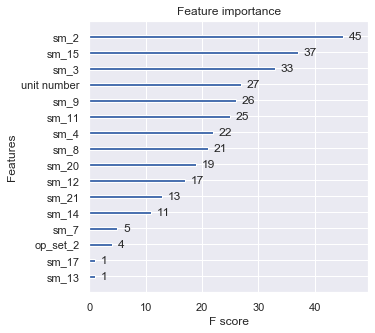

In [85]:
xgb.plot_importance(xg1)
plt.rcParams['figure.figsize'] = [5, 5]
plt.show()

In [86]:
# use feature importance for feature selection
from numpy import loadtxt
from numpy import sort
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectFromModel
# split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=7)
# fit model on all training data
modelgb = XGBClassifier()
modelgb.fit(X_train, y_train)
# make predictions for test data and evaluate
y_pred = modelgb.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
# Fit model using each importance as a threshold
thresholds = sort(modelgb.feature_importances_)
for thresh in thresholds:
	# select features using threshold
	selection = SelectFromModel(modelgb, threshold=thresh, prefit=True)
	select_X_train = selection.transform(X_train)
	# train model
	selection_model = XGBClassifier()
	selection_model.fit(select_X_train, y_train)
	# eval model
	select_X_test = selection.transform(X_test)
	y_pred = selection_model.predict(select_X_test)
	predictions = [round(value) for value in y_pred]
	accuracy = accuracy_score(y_test, predictions)
	print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy*100.0))

Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.000, n=26, Accuracy: 1.64%
Thresh=0.039, n=19, Accuracy: 1.64%
Thresh=0.043, n=18, Accuracy: 1.76%
Thresh=0.043, n=17, Accuracy: 1.64%
Thresh=0.045, n=16, Accuracy: 1.67%
Thresh=0.046, n=15, Accuracy: 1.69%
Thresh=0.046, n=14, Accuracy: 1.72%
Thresh=0.047, n=13, Accuracy: 1.69%
Thresh=0.048, n=12, Accuracy: 1.87%
Thresh=0.048, n=11, Accuracy: 1.57%
Thresh=0.049, n=10, Accuracy: 1.67%
Thresh=0.049, n=9, Accuracy: 1.67%
Thresh=0.051, n=8, Accuracy: 1.72%
Thresh=0.051, n=7, Accuracy: 1.69%
Thresh=0.052, n=6, Accuracy: 1.57%
Thresh=0.056, n=5, Accuracy: 1.70%
Thresh=0.061, n=4, Accuracy: 1.28%
Thresh=0.065, n=3, Accuracy: 1.82%
Thresh=0.076, n=2, Accuracy: 1.82%
Thresh=0.083, n=1, Accuracy: 1.38%


In [91]:
import pickle 
filename = 'xgb_xgboost.sav'
pickle.dump(xgb, open(filename, 'wb'))  

TypeError: can't pickle module objects

In [92]:
#Standard test using normal condiitons
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80)
#Create a Gaussian Classifier
rf1=RandomForestClassifier(n_estimators = 100, max_depth=2, class_weight='balanced')

#Train the model using the training sets y_pred=clf.predict(X_test)
rf1.fit(X_train,y_train)

# prediction on test set
y_pred=rf1.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.007270524083611027


In [97]:
# evaluate adaboost ensemble for regression
from numpy import mean
from numpy import std
from sklearn.datasets import make_regression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
# define the model
model = AdaBoostRegressor()
# evaluate the model
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))


MAE: -32.648 (0.654)


In [15]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn import tree
from sklearn.model_selection import GridSearchCV
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

In [99]:
for depth in range (1,10):
    tree_regressor=tree.DecisionTreeRegressor(max_depth=depth,random_state=1)
    if tree_regressor.fit(X,y).tree_.max_depth<depth:
        break
    score=np.mean(cross_val_score(tree_regressor,X,y,scoring='neg_mean_squared_error', cv=10,n_jobs=1))
    print(depth, score)

1 -2614.4618845359246
2 -1882.6431312852924
3 -2013.7109732699253
4 -1926.39196794312
5 -1853.5307956208624
6 -1898.4014591128703
7 -1993.08182953859
8 -2166.2105192786453
9 -2360.310010469001


In [100]:
ada=AdaBoostRegressor()
search_grid={'n_estimators':[500,1000,2000],'learning_rate':[.001,0.01,.1],'random_state':[1]}
search=GridSearchCV(estimator=ada,param_grid=search_grid,scoring='neg_mean_squared_error',n_jobs=1,cv=10)

In [17]:
# adaboost ensemble for making predictions for regression
from sklearn.datasets import make_regression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80)
# define the model
model = AdaBoostRegressor()
# fit the model on the whole dataset
model.fit(X_test, y_test)

AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=None)

ValueError: x and y must be the same size

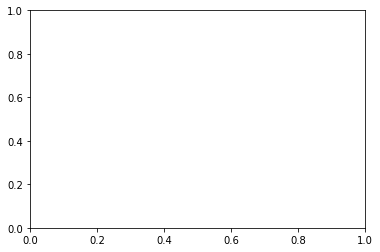

In [19]:
# importing necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor

# Fit regression model
regr_1 = DecisionTreeRegressor(max_depth=4)

regr_2 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4),
                          n_estimators=300)

regr_1.fit(X, y)
regr_2.fit(X, y)

# Predict
y_1 = regr_1.predict(X)
y_2 = regr_2.predict(X)

# Plot the results
plt.figure()
plt.scatter(X, y, c="k", label="training samples")
plt.plot(X, y_1, c="g", label="n_estimators=1", linewidth=2)
plt.plot(X, y_2, c="r", label="n_estimators=300", linewidth=2)
plt.xlabel("data")
plt.ylabel("target")
plt.title("Boosted Decision Tree Regression")
plt.legend()
plt.show()

In [20]:
#Second Dataset Adaboost Regression.
# evaluate adaboost ensemble for regression
from numpy import mean
from numpy import std
from sklearn.datasets import make_regression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
# define the model
model = AdaBoostRegressor()
# evaluate the model
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))


MAE: -32.488 (0.883)


In [21]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
ada_reg = AdaBoostRegressor(n_estimators=100)
print(ada_reg)
AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
         n_estimators=100, random_state=None) 

AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=100, random_state=None)


AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=100, random_state=None)

In [22]:
ada_reg.fit(X_train, y_train)


AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=100, random_state=None)

In [23]:
scores = cross_val_score(ada_reg, X_train,y_train,cv=5)
print("Mean cross-validataion score: %.2f" % scores.mean())

Mean cross-validataion score: 0.67


In [24]:
kfold = KFold(n_splits=10, shuffle=True)
kf_cv_scores = cross_val_score(ada_reg, X_train, y_train, cv=kfold )
print("K-fold CV average score: %.2f" % kf_cv_scores.mean())

K-fold CV average score: 0.67


In [25]:
y_pred = ada_reg.predict(X_test)
mse = mean_squared_error(y_test,y_pred)
print("MSE: %.2f" % mse)

MSE: 1426.40


In [26]:
print("RMSE: %.2f" % np.sqrt(mse))

RMSE: 37.77


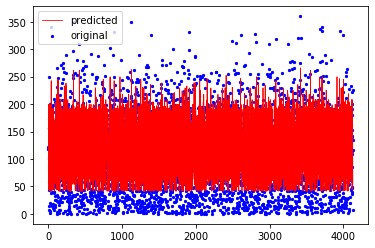

In [27]:
x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s=5, color="blue", label="original")
plt.plot(x_ax, y_pred, lw=0.8, color="red", label="predicted")
plt.legend()
plt.show()

In [30]:
#Performing PCA for 10 components
pca10 = PCA(n_components=10, svd_solver='full')
pca10.fit(df_1)

PCA(copy=True, iterated_power='auto', n_components=10, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

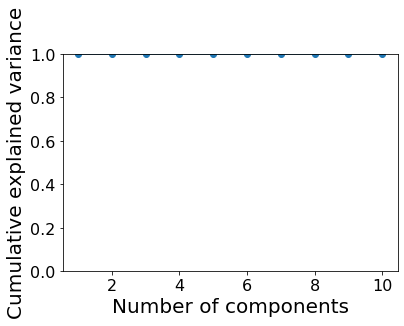

In [31]:
#Variance for components displayed in graph.
plt.plot(range(1,pca10.n_components+1), np.cumsum(pca10.explained_variance_ratio_),'-o')
plt.xlabel('Number of components', fontsize=20)
plt.ylabel('Cumulative explained variance', fontsize=20);
plt.tick_params(labelsize=16)
plt.ylim(0,1)

plt.show()

In [ ]:
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
# random forest model creation
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
# predictions
rfc_predict = rfc.predict(X_test)
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
rfc_cv_score = cross_val_score(rfc, X, y, cv=5, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, rfc_predict))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, rfc_predict))
print('\n')
print("=== All AUC Scores ===")
print(rfc_cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", rfc_cv_score.mean())

C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


In [ ]:
#Calculating and plotting the feature importance
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
feature_imp = pd.Series(clf1.feature_importances_,index=X.columns).sort_values(ascending=False)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()
plt.figure(figsize=(100,100))

In [30]:
import os
import pandas as pd
from pandas import DataFrame,Series
from sklearn import tree
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.preprocessing import StandardScaler
import statsmodels.formula.api as smf
import statsmodels.api as sm
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn import neighbors
from sklearn import linear_model
%matplotlib inline

In [40]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80)
X_Train=X_train.values
X_Train=np.asarray(X_Train)

# Finding normalised array of X_Train
X_std=StandardScaler().fit_transform(X_Train)

Text(0, 0.5, 'Cumulative explained variance')

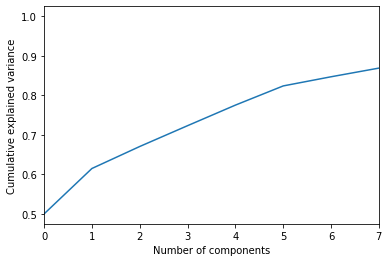

In [35]:
from sklearn.decomposition import PCA
pca = PCA().fit(X_std)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,7,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[t

(-2, 2)

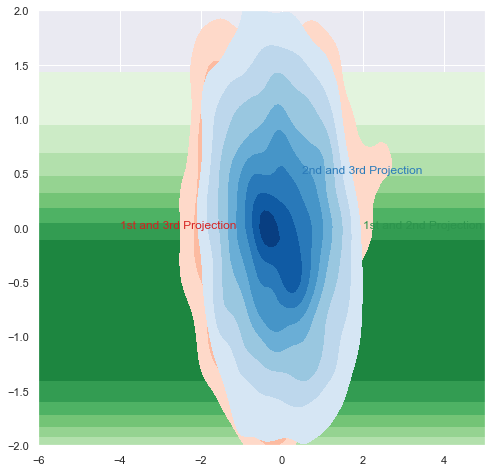

In [36]:
from sklearn.decomposition import PCA
sklearn_pca=PCA(n_components=6)
X_Train=sklearn_pca.fit_transform(X_train)

sns.set(style='darkgrid')
f, ax = plt.subplots(figsize=(8, 8))
# ax.set_aspect('equal')
ax = sns.kdeplot(X_Train[:,0], X_Train[:,1], cmap="Greens",
          shade=True, shade_lowest=False)
ax = sns.kdeplot(X_Train[:,1], X_Train[:,2], cmap="Reds",
          shade=True, shade_lowest=False)
ax = sns.kdeplot(X_Train[:,2], X_Train[:,3], cmap="Blues",
          shade=True, shade_lowest=False)
red = sns.color_palette("Reds")[-2]
blue = sns.color_palette("Blues")[-2]
green = sns.color_palette("Greens")[-2]
ax.text(0.5, 0.5, "2nd and 3rd Projection", size=12, color=blue)
ax.text(-4, 0.0, "1st and 3rd Projection", size=12, color=red)
ax.text(2, 0, "1st and 2nd Projection", size=12, color=green)
plt.xlim(-6,5)
plt.ylim(-2,2)

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result ei

(-2, 2)

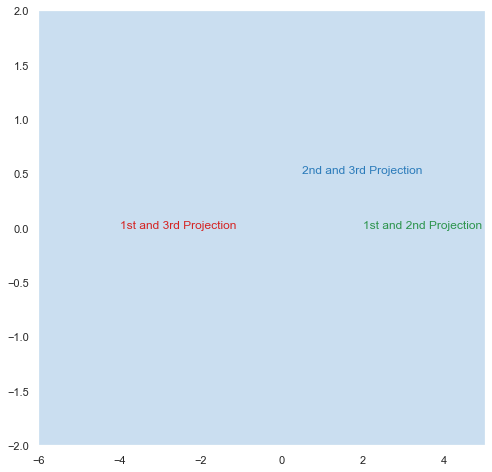

In [326]:
from sklearn.decomposition import PCA
sklearn_pca=PCA(n_components=6)
X_Train=sklearn_pca.fit_transform(X_train)

sns.set(style='darkgrid')
f, ax = plt.subplots(figsize=(8, 8))
# ax.set_aspect('equal')
ax = sns.kdeplot(X_Train[:,0], X_Train[:,1], cmap="Greens",
          shade=True, shade_lowest=False)
ax = sns.kdeplot(X_Train[:,1], X_Train[:,2], cmap="Reds",
          shade=True, shade_lowest=False)
ax = sns.kdeplot(X_Train[:,2], X_Train[:,3], cmap="Blues",
          shade=True, shade_lowest=False)
red = sns.color_palette("Reds")[-2]
blue = sns.color_palette("Blues")[-2]
green = sns.color_palette("Greens")[-2]
ax.text(0.5, 0.5, "2nd and 3rd Projection", size=12, color=blue)
ax.text(-4, 0.0, "1st and 3rd Projection", size=12, color=red)
ax.text(2, 0, "1st and 2nd Projection", size=12, color=green)
plt.xlim(-6,5)
plt.ylim(-2,2)

In [43]:
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [44]:
feature_names = df_1.drop('RUL', 1).columns
import pandas as pd
from sklearn.metrics import r2_score

# print R^2 for the training set
print('The R-squared value for the training set is: {:0.4f}'.format(r2_score(y_train, lm.predict(X_train))))

# print intercept and coefficients
param_df = pd.DataFrame({"Coefficient": [lm.intercept_] + list(lm.coef_),
                         "Feature": ['intercept'] + list(feature_names)})
param_df[['Feature', 'Coefficient']]

The R-squared value for the training set is: -3.2202


,Feature,Coefficient
0,intercept,1.079142e+06
1,unit number,3.805117e+00
2,time_cycles,7.529181e-01
3,op_set_1,-3.508977e+03
4,op_set_2,-3.563299e+04
5,op_set_3,4.655404e-08
6,sm_1,4.242801e-08
7,sm_2,-5.537620e+01
8,sm_3,-1.960391e+00
9,sm_4,2.856663e-01


In [45]:
import numpy as np

predicted = lm.predict(X_test)

r_squared = r2_score(y_test, predicted)
mae = np.mean(abs(predicted - y_test))
rmse = np.sqrt(np.mean((predicted - y_test)**2))
rae = np.mean(abs(predicted - y_test)) / np.mean(abs(y_test - np.mean(y_test)))
rse = np.mean((predicted - y_test)**2) / np.mean((y_test - np.mean(y_test))**2)

# Create a data frame for storing results from each model
summary_df = pd.DataFrame(index = ['R-squared', 'Mean Absolute Error', 'Root Mean Squared Error',
                                   'Relative Absolute Error', 'Relative Squared Error'])
summary_df['Linear Regression, all variables'] = [r_squared, mae, rmse, rae, rse]
summary_df

,"Linear Regression, all variables"
R-squared,-3.285799
Mean Absolute Error,117.139209
Root Mean Squared Error,142.572904
Relative Absolute Error,2.058111
Relative Squared Error,4.285799


Optimal number of features: 14
Features selected: unit number, time_cycles, sm_2, sm_4, sm_7, sm_8, sm_11, sm_12, sm_13, sm_14, sm_15, sm_17, sm_20, sm_21
Suggested order of feature removal: sm_19, sm_18, sm_16, op_set_3, sm_1, sm_10, sm_5, op_set_1, sm_3, sm_6, op_set_2, sm_9, unit number, time_cycles, sm_2, sm_4, sm_7, sm_8, sm_11, sm_12, sm_13, sm_14, sm_15, sm_17, sm_20, sm_21


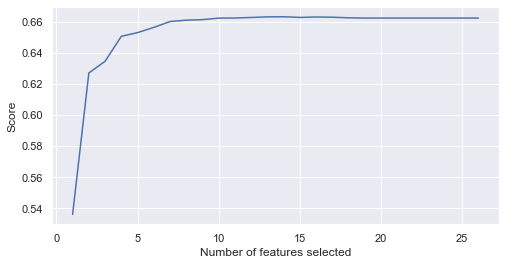

In [46]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFECV
import seaborn as sns

# scale each feature to zero mean and unit variance
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# recursive feature elimination with cross validation, using r-squared score as metric
lm = LinearRegression()  # using a linear model as before
rfecv = RFECV(estimator=lm, step=1, cv=5) 
rfecv.fit(X_scaled, y_train)

# print the optimal number of features
print('Optimal number of features: {}'.format(rfecv.n_features_))

# save the selected features
print('Features selected: {}'.format(', '.join(np.array(feature_names)[rfecv.support_].tolist())))

# get the feature elimination order
ranked_features, _ = zip(*sorted(zip(feature_names, rfecv.ranking_.tolist()),
                                 key=lambda x: x[1],
                                 reverse=True))
print('Suggested order of feature removal: {}'.format(', '.join(ranked_features)))

# plot number of features vs. scores
sns.set_style("darkgrid")
plt.figure(figsize=(8, 4))
plt.xlabel("Number of features selected")
plt.ylabel("Score")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

In [52]:
df_1[df_1['unit number']==2]

,unit number,time_cycles,op_set_1,op_set_2,op_set_3,sm_1,sm_2,sm_3,sm_4,sm_5,...,sm_13,sm_14,sm_15,sm_16,sm_17,sm_18,sm_19,sm_20,sm_21,RUL
192,2,1,-0.0018,0.0006,100.0,518.67,641.89,1583.84,1391.28,14.62,...,2388.06,8137.72,8.3905,0.03,391,2388,100.0,38.94,23.4585,286
193,2,2,0.0043,-0.0003,100.0,518.67,641.82,1587.05,1393.13,14.62,...,2387.98,8131.09,8.4167,0.03,392,2388,100.0,39.06,23.4085,285
194,2,3,0.0018,0.0003,100.0,518.67,641.55,1588.32,1398.96,14.62,...,2387.99,8140.58,8.3802,0.03,391,2388,100.0,39.11,23.4250,284
195,2,4,0.0035,-0.0004,100.0,518.67,641.68,1584.15,1396.08,14.62,...,2387.93,8140.44,8.4018,0.03,391,2388,100.0,39.13,23.5027,283
196,2,5,0.0005,0.0004,100.0,518.67,641.73,1579.03,1402.52,14.62,...,2387.94,8136.67,8.3867,0.03,390,2388,100.0,39.18,23.4234,282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,2,283,0.0046,0.0002,100.0,518.67,643.78,1602.03,1429.67,14.62,...,2388.20,8174.85,8.5199,0.03,398,2388,100.0,38.42,23.0358,4
475,2,284,-0.0006,0.0001,100.0,518.67,643.91,1601.35,1430.04,14.62,...,2388.21,8166.83,8.5291,0.03,395,2388,100.0,38.23,23.1196,3
476,2,285,-0.0007,0.0004,100.0,518.67,643.67,1596.84,1431.17,14.62,...,2388.22,8164.83,8.5242,0.03,396,2388,100.0,38.39,23.1155,2
477,2,286,-0.0010,-0.0003,100.0,518.67,643.44,1603.63,1429.57,14.62,...,2388.22,8169.97,8.4932,0.03,395,2388,100.0,38.33,23.0169,1


In [21]:
def get_stationarity(timeseries):
    
    # rolling statistics
    rolling_mean = timeseries.rolling(window=12).mean()
    rolling_std = timeseries.rolling(window=12).std()
    
    # rolling statistics plot
    original = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolling_mean, color='red', label='Rolling Mean')
    std = plt.plot(rolling_std, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Dickey–Fuller test:
    result = adfuller(df_1['sm_1'])
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

In [55]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

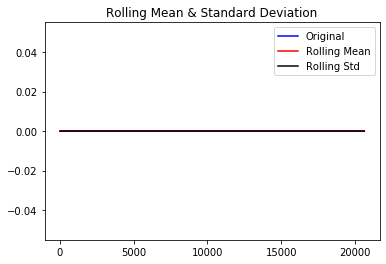

ADF Statistic: nan
p-value: nan
Critical Values:
	1%: -3.4306670195761537
	5%: -2.8616801117464457
	10%: -2.56684457761323


C:\Users\Amardeep\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:889: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\Amardeep\anaconda3\lib\site-packages\statsmodels\base\model.py:1362: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1738: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


In [22]:
df_log = np.log(df_1['sm_1'])
rolling_mean = df_log.rolling(window=12).mean()
df_log_minus_mean = df_log - rolling_mean
df_log_minus_mean.dropna(inplace=True)
get_stationarity(df_log_minus_mean)

C:\Users\Amardeep\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\misc.py:414: RuntimeWarning: invalid value encountered in double_scalars
  return ((data[: n - h] - mean) * (data[h:] - mean)).sum() / float(n) / c0


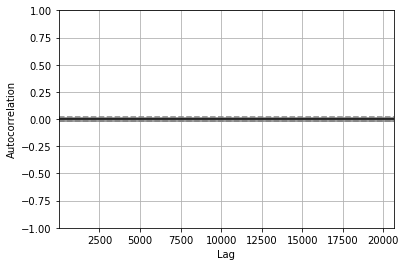

In [24]:
pd.plotting.autocorrelation_plot(df_1['sm_1'])

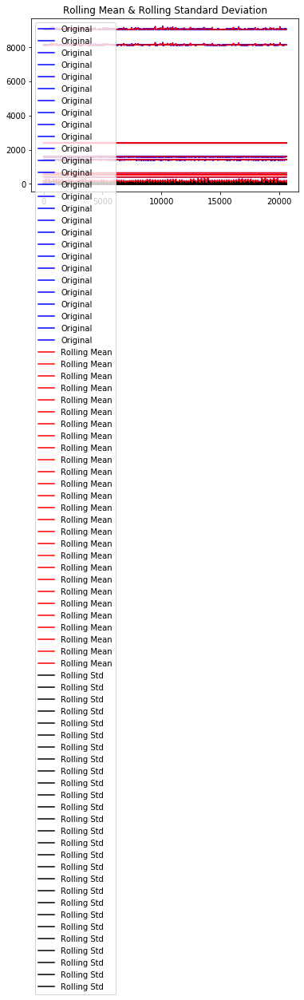

In [25]:
rolling_mean = df_1.rolling(window = 12).mean()
rolling_std = df_1.rolling(window = 12).std()
plt.plot(df_1, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

In [26]:
result = adfuller(df_1['sm_2'])
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))

ADF Statistic: -17.225396302540585
p-value: 6.2414625012575756e-30
Critical Values:
	1%: -3.4306671887235236
	5%: -2.8616801864997705
	10%: -2.566844617403054


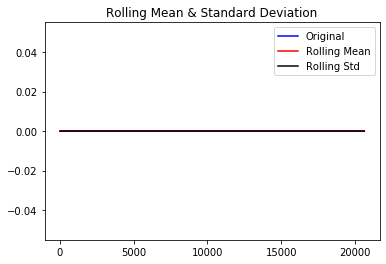

ADF Statistic: nan
p-value: nan
Critical Values:
	1%: -3.4306670195761537
	5%: -2.8616801117464457
	10%: -2.56684457761323


C:\Users\Amardeep\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:889: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\Amardeep\anaconda3\lib\site-packages\statsmodels\base\model.py:1362: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1738: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


In [27]:
rolling_mean_exp_decay = df_log.ewm(halflife=12, min_periods=0, adjust=True).mean()
df_log_exp_decay = df_log - rolling_mean_exp_decay
df_log_exp_decay.dropna(inplace=True)
get_stationarity(df_log_exp_decay)

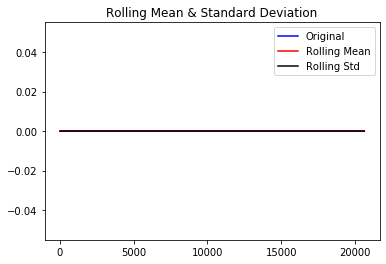

ADF Statistic: nan
p-value: nan
Critical Values:
	1%: -3.4306670195761537
	5%: -2.8616801117464457
	10%: -2.56684457761323


C:\Users\Amardeep\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:889: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
C:\Users\Amardeep\anaconda3\lib\site-packages\statsmodels\base\model.py:1362: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\Amardeep\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1738: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0


In [28]:
df_log_shift = df_log - df_log.shift()
df_log_shift.dropna(inplace=True)
get_stationarity(df_log_shift)

In [70]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# Fit only to the training data
scaler.fit(X_train)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [71]:
# Now apply the transformations to the data:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [72]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(hidden_layer_sizes=(30,30,30))
mlp.fit(X_train,y_train)


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(30, 30, 30), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [73]:
predictions = mlp.predict(X_test)

In [79]:
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
# create the inputs and outputs
X, y = make_blobs(n_samples=1000, centers=2, n_features=2, random_state=2)
# define model
model = LogisticRegression(solver='lbfgs')
# fit model
model.fit(X_train, y_train)
# make predictions
yhat = model.predict(X_train)
# evaluate predictions
acc = accuracy_score(y_train, yhat)
print(acc)

0.11633543383422201


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [80]:
new_output = model.predict(X_test)

In [85]:
from sklearn.ensemble import BaggingRegressor
model = BaggingRegressor(tree.DecisionTreeRegressor(random_state=1))
model.fit(X_train, y_train)
model.score(X_test,y_test)

0.8073049632097966

In [86]:
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor()
model.fit(X_train, y_train)
model.score(X_test,y_test)

0.8677011571707565

In [90]:
import lightgbm as lgb
train_data=lgb.Dataset(X_train,label=y_train)
params = {'learning_rate':0.001}
model= lgb.train(params, train_data, 100)
y_pred=model.predict(X_test)
from sklearn.metrics import mean_squared_error
rmse=mean_squared_error(y_pred,y_test)**0.5

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3120
[LightGBM] [Info] Number of data points in the train set: 4126, number of used features: 19
[LightGBM] [Info] Start training from score 107.349491


In [92]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

def decisiontree (X_train, y_train, X_test, y_test):
    param_grid = {'max_depth': range(1,100)}
    grid = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=5)
    grid.fit(X_train, y_train)
    print ('Best cross validation score: {:.2f}'.format(grid.best_score_))
    print ('Best parameters:', grid.best_params_)
    print ('Test score:', grid.score(X_test, y_test))

In [93]:
decisiontree(X_train, y_train, X_test, y_test)


Best cross validation score: 0.72
Best parameters: {'max_depth': 8}
Test score: 0.7392304856368994


In [97]:
from sklearn.ensemble import RandomForestRegressor

def randomforest (X_train, y_train, X_test, y_test):
    param_grid = {'max_depth': range(1,20)}
    grid = GridSearchCV(RandomForestRegressor(), param_grid, cv=5)
    grid.fit(X_train, y_train)
    print ('Best cross validation score: {:.2f}'.format(grid.best_score_))
    print ('Best parameters:', grid.best_params_)
    print ('Test score:', grid.score(X_test, y_test))

In [98]:
randomforest(X_train, y_train, X_test, y_test)


Best cross validation score: 0.82
Best parameters: {'max_depth': 14}
Test score: 0.8347357048545752


In [101]:
from sklearn.ensemble import GradientBoostingRegressor

def gradientboosting (X_train, y_train, X_test, y_test):
    param_grid = {'max_depth': range(1,6),  'n_estimators':[10,100,1000]}
    grid = GridSearchCV(GradientBoostingRegressor(), param_grid, cv=5)
    grid.fit(X_train, y_train)
    print ('Best cross validation score: {:.2f}'.format(grid.best_score_))
    print ('Best parameters:', grid.best_params_)
    print ('Test score:', grid.score(X_test, y_test))

In [102]:
gradientboosting(X_train, y_train, X_test, y_test)

Best cross validation score: 0.97
Best parameters: {'max_depth': 3, 'n_estimators': 1000}
Test score: 0.97667780066519


In [103]:
from sklearn.neighbors import KNeighborsRegressor

def knn (X_train, y_train, X_test, y_test):
    param_grid = {'n_neighbors': range(1,100)}
    grid = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5)
    grid.fit(X_train, y_train)
    print ('Best cross validation score: {:.2f}'.format(grid.best_score_))
    print ('Best parameters:', grid.best_params_)
    print ('Test score:', grid.score(X_test, y_test))

In [104]:
knn(X_train, y_train, X_test, y_test)


Best cross validation score: 0.70
Best parameters: {'n_neighbors': 23}
Test score: 0.706653603251312


In [105]:
from sklearn.linear_model import Lasso

def lassoreg (X_train, y_train, X_test, y_test):
    param_grid = {'alpha': [0.01, 0.1, 1, 10, 100]}
    grid = GridSearchCV(Lasso(), param_grid, cv=5)
    grid.fit(X_train, y_train)
    print ('Best cross validation score: {:.2f}'.format(grid.best_score_))
    print ('Best parameters:', grid.best_params_)
    print ('Test score:', grid.score(X_test, y_test))

In [106]:
lassoreg(X_train, y_train, X_test, y_test)


Best cross validation score: 0.66
Best parameters: {'alpha': 1}
Test score: 0.668305714921204


In [107]:
from sklearn.linear_model import Ridge

def ridgereg (X_train, y_train, X_test, y_test):
    param_grid = {'alpha': [0.01, 0.1, 1, 10, 100]}
    grid = GridSearchCV(Ridge(), param_grid, cv=5)
    grid.fit(X_train, y_train)
    print ('Best cross validation score: {:.2f}'.format(grid.best_score_))
    print ('Best parameters:', grid.best_params_)
    print ('Test score:', grid.score(X_test, y_test))

In [108]:
ridgereg(X_train, y_train, X_test, y_test)


Best cross validation score: 0.66
Best parameters: {'alpha': 100}
Test score: 0.6687330180131152


In [28]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
from sklearn.svm import SVR
from sklearn import model_selection
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

# Rescale the data
scaler = MinMaxScaler(feature_range=(0,1))
rescaledX = scaler.fit_transform(X)

# Convert X back to a Pandas DataFrame, for convenience
X = pd.DataFrame(rescaledX, index=X.index, columns=X.columns)
test_size = 0.30
seed = 1
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
models = [LinearRegression(), LogisticRegression(), SVR(), BaggingRegressor(), GradientBoostingRegressor(), RandomForestRegressor(), DecisionTreeRegressor(), KNeighborsRegressor(), Lasso(), Ridge()]



In [29]:
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_absolute_error(y_train, predictions))

LinearRegression 30.621728306412017


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 30.209819264593865
SVR 27.45460752799841
BaggingRegressor 4.95347967592272
GradientBoostingRegressor 17.491082728674197
RandomForestRegressor 4.383202686794543
DecisionTreeRegressor 0.0
KNeighborsRegressor 20.98284052350945
Lasso 31.58975254680859
Ridge 30.619937207610707


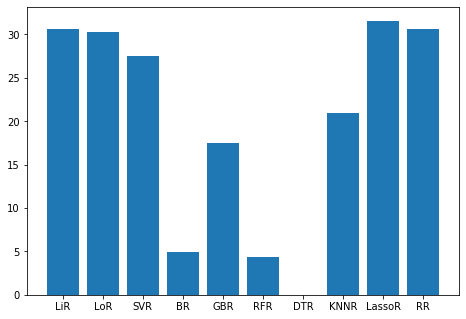

In [35]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
mdls = ['LiR','LoR', 'SVR', 'BR', 'GBR', 'RFR','DTR','KNNR','LassoR','RR']
mae = [30.621728306412017,30.209819264593865,27.45460752799841,4.95347967592272,17.491082728674197,4.383202686794543,0.0,20.98284052350945,31.58975254680859,30.619937207610707]
ax.bar(mdls,mae)
plt.show()

In [32]:
from sklearn.metrics import r2_score
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, r2_score(y_train, predictions))

LinearRegression -0.12103493154724165


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 0.5964246945193712
SVR 0.6823809120616358
BaggingRegressor 0.986041273651574
GradientBoostingRegressor 0.882244731216133
RandomForestRegressor 0.9911423015562967
DecisionTreeRegressor 1.0
KNeighborsRegressor 0.8052836336424275
Lasso 0.6445795426231673
Ridge 0.6656531021976397


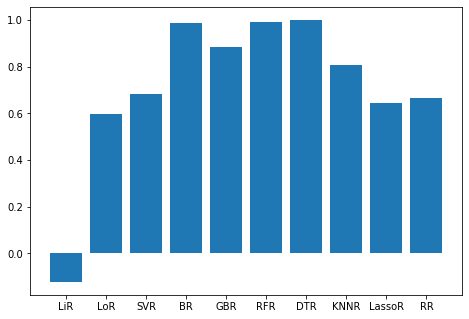

In [36]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
mdls = ['LiR','LoR', 'SVR', 'BR', 'GBR', 'RFR','DTR','KNNR','LassoR','RR']
rts = [-0.12103493154724165,0.5964246945193712,0.6823809120616358,0.986041273651574,0.882244731216133,0.9911423015562967,1.0,0.8052836336424275,0.6445795426231673,0.6656531021976397]
ax.bar(mdls,rts)
plt.show()

In [38]:
from sklearn.metrics import mean_tweedie_deviance
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_tweedie_deviance(y_train, predictions))


LinearRegression 1581.0668248643915


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 1908.4535696973894
SVR 1501.978128860254
BaggingRegressor 63.80129146181012
GradientBoostingRegressor 556.848895384243
RandomForestRegressor 40.40160065092444
DecisionTreeRegressor 0.0
KNeighborsRegressor 920.7876185859704
Lasso 1680.73574228355
Ridge 1581.0817013896558


In [41]:
from sklearn.metrics import median_absolute_error
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, median_absolute_error(y_train, predictions))

LinearRegression 24.880982523883688


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 20.0
SVR 19.216656907710345
BaggingRegressor 2.8000000000000114
GradientBoostingRegressor 12.720798292563764
RandomForestRegressor 2.9099999999999966
DecisionTreeRegressor 0.0
KNeighborsRegressor 14.0
Lasso 26.06284486113428
Ridge 24.876464932436534


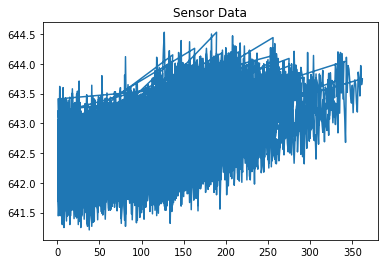

In [47]:
plt.title("Sensor Data") #The title of our plot
plt.plot(df_1['time_cycles'],df_1['sm_2']) #Draw the plot object
plt.show() #Display the plot

In [62]:
dftest=df_1[df_1['unit number']==1]

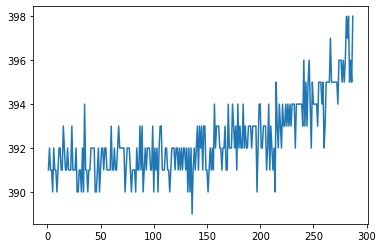

In [72]:
dftest=df_1[df_1['unit number']==2]
plt.plot(dftest['time_cycles'],dftest['sm_17'])

In [56]:
def get_stationarity(timeseries):
    
    # rolling statistics
    rolling_mean = timeseries.rolling(window=12).mean()
    rolling_std = timeseries.rolling(window=12).std()
    
    # rolling statistics plot
    original = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(rolling_mean, color='red', label='Rolling Mean')
    std = plt.plot(rolling_std, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Dickey–Fuller test:
    result = adfuller(dftest['sm_17'])
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

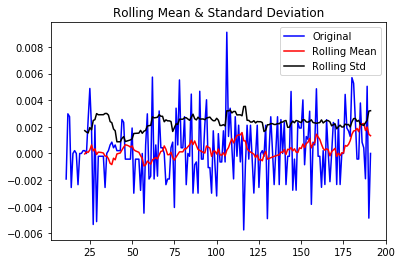

ADF Statistic: -0.3358413293424242
p-value: 0.9202724996406353
Critical Values:
	1%: -3.4662005731940853
	5%: -2.8772932777920364
	10%: -2.575167750182615


In [57]:
df_log = np.log(dftest['sm_17'])
rolling_mean = df_log.rolling(window=12).mean()
df_log_minus_mean = df_log - rolling_mean
df_log_minus_mean.dropna(inplace=True)
get_stationarity(df_log_minus_mean)

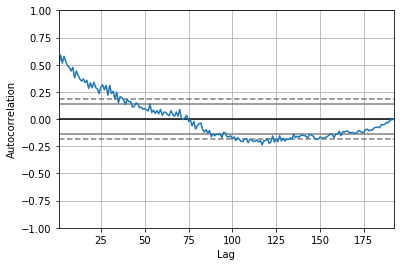

In [58]:
pd.plotting.autocorrelation_plot(dftest['sm_17'])

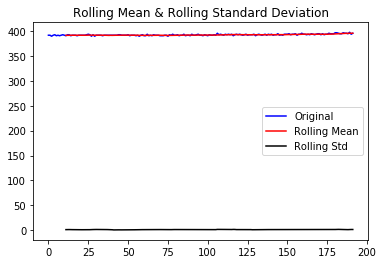

In [60]:
rolling_mean = dftest['sm_17'].rolling(window = 12).mean()
rolling_std = dftest['sm_17'].rolling(window = 12).std()
plt.plot(dftest['sm_17'], color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

In [63]:
df_by_un = df_1.groupby('unit number')

In [71]:
df_by_un

## Regression Model Evaluation Using Generated Features

In [8]:
#Loading features generated from training set:
wvt_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\trainwvt1.csv')
wpsd_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\trainwpsd1.csv')
opsd_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\trainopsd1.csv')
vf_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\trainvf1.csv')
fft_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\fft_train_1.csv')
ae_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\ae_train_1.csv')
ip_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\ip_train_1.csv')
iff_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\iff_train_1.csv')
tempshift_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\tempshift_train_1.csv')
srtempshift_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\srtempshift_train_1.csv')
rollshift_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\rollshift_train_1.csv')
ac_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\ac_train_1.csv')
cwtt_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\cwtt_train_1.csv')
idwt_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\idwt_train_1.csv')
lpf_train=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\train\lpf_train_1.csv')
#Loading features generated from testing set:
wvt_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\testwvt1.csv')
wpsd_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\testwpsd1.csv')
opsd_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\testopsd1.csv')
vf_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\testvf1.csv')
fft_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\fft_test_1.csv')
ae_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\ae_test_1.csv')
ip_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\ip_test_1.csv')
iff_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\iff_test_1.csv')
tempshift_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\tempshift_test_1.csv')
srtempshift_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\srtempshift_test_1.csv')
rollshift_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\rollshift_test_1.csv')
ac_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\ac_test_1.csv')
cwtt_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\cwtt_test_1.csv')
idwt_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\idwt_test_1.csv')
lpf_test=pd.read_csv(r'C:\Users\Amardeep\Downloads\ML Nanodegree\PROJECT3\WVT\lpf_test_1.csv')

In [9]:
#Combining features with training set
new_df_train = pd.concat([df_train, wvt_train,wpsd_train, opsd_train,vf_train,fft_train,ae_train,ip_train,iff_train,tempshift_train,srtempshift_train,rollshift_train,cwtt_train,idwt_train,lpf_train], axis=1)
#Combining features with testing set
new_df_test= pd.concat([data_test_1, wvt_test,wpsd_test, opsd_test,vf_test,fft_test,ae_test,ip_test,iff_test,tempshift_test,srtempshift_test,rollshift_test,cwtt_test,idwt_test,lpf_test], axis=1)

In [10]:
#Dropping NaN values and filling remaining values with 0
new_df_train=new_df_train.dropna(how="all")
new_df_train=new_df_train.fillna(0)


In [11]:
new_df_train

,unit number,time_cycles,op_set_1,op_set_2,op_set_3,sm_1,sm_2,sm_3,sm_4,sm_5,...,lpf_sm_12,lpf_sm_13,lpf_sm_14,lpf_sm_15,lpf_sm_16,lpf_sm_17,lpf_sm_18,lpf_sm_19,lpf_sm_20,lpf_sm_21
0,1.0,1.0,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.583621,2388.079131,8144.961003,8.434814,0.03,392.933115,2388.0,100.0,38.850535,23.309616
1,1.0,2.0,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,521.583651,2388.079134,8144.958247,8.434814,0.03,392.933024,2388.0,100.0,38.850538,23.309610
2,1.0,3.0,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,521.583682,2388.079137,8144.955363,8.434813,0.03,392.932928,2388.0,100.0,38.850541,23.309604
3,1.0,4.0,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,521.583709,2388.079140,8144.952832,8.434813,0.03,392.932844,2388.0,100.0,38.850544,23.309598
4,1.0,5.0,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,521.583733,2388.079142,8144.950609,8.434812,0.03,392.932772,2388.0,100.0,38.850546,23.309593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20627,100.0,197.0,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,521.583476,2388.079118,8144.974320,8.434817,0.03,392.933557,2388.0,100.0,38.850520,23.309645
20628,100.0,198.0,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,521.583501,2388.079120,8144.972076,8.434817,0.03,392.933483,2388.0,100.0,38.850523,23.309640
20629,100.0,199.0,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,521.583529,2388.079123,8144.969497,8.434816,0.03,392.933397,2388.0,100.0,38.850526,23.309634
20630,100.0,200.0,-0.0032,-0.0005,100.0,518.67,643.85,1600.38,1432.14,14.62,...,521.583564,2388.079126,8144.966252,8.434816,0.03,392.933288,2388.0,100.0,38.850529,23.309627


In [255]:
#Scaling the bin and obtaining the scores for the pca analysis.
E=new_df_train
E.set_index('RUL', inplace=True)
E_index=E.index
E= StandardScaler().fit_transform(E)
pca = PCA(n_components=3, svd_solver='full')
PC_scores = pca.fit_transform(E)
scores_pd = pd.DataFrame(data = PC_scores
                         ,columns = ['PC1', 'PC2', 'PC3']
                         ,index =E_index)
loadings_pd = pd.DataFrame(data = pca.components_.T
                           ,columns = ['PC1', 'PC2', 'PC3']
                           ,index = new_df_train.columns)

In [256]:
#PLotting the PCA plot fucntion
def myplot(scores,loadings,loading_labels=None,score_labels=None):
    # adjusting the scores to fit in (-1,1)
    xt = scores[:,0]
    yt = scores[:,1]
    n = loadings.shape[0]
    scalext = 1.0/(xt.max() - xt.min())
    scaleyt = 1.0/(yt.max() - yt.min())
    xt_scaled = xt * scalext
    yt_scaled = yt * scaleyt
    # adjusting the loadings to fit in (-1,1)
    p = loadings
    p_scaled = MaxAbsScaler().fit_transform(p)
    
    #plt.scatter(xs * scalex,ys * scaley, s=10)
    for (x,y), label in zip(np.vstack((xt_scaled, yt_scaled)).T,score_labels):
        plt.text(x, y, label, ha='center', size=11)
    
    for i in range(n):
        plt.arrow(0, 0, p_scaled[i,0], p_scaled[i,1], color = 'r',alpha = 0.5)
        if loading_labels is None:
            plt.text(p_scaled[i,0], p_scaled[i,1], "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(p_scaled[i,0], p_scaled[i,1], loading_labels[i], color = 'r', ha = 'center', va = 'center', size=16)
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1), fontsize=20);
    plt.ylabel("PC{}".format(2), fontsize=20);
    plt.tick_params(labelsize=16)
    plt.grid()

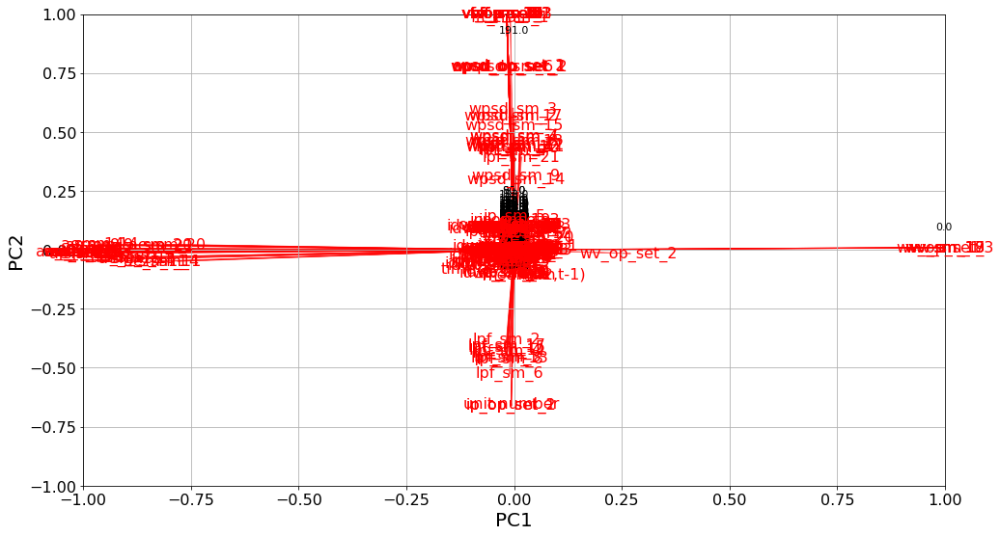

In [257]:
plt.rcParams["figure.figsize"] = [16,9]
myplot(PC_scores[:,:2],loadings_pd.iloc[:,:2],loading_labels=loadings_pd.index,score_labels=scores_pd.index)
plt.show()

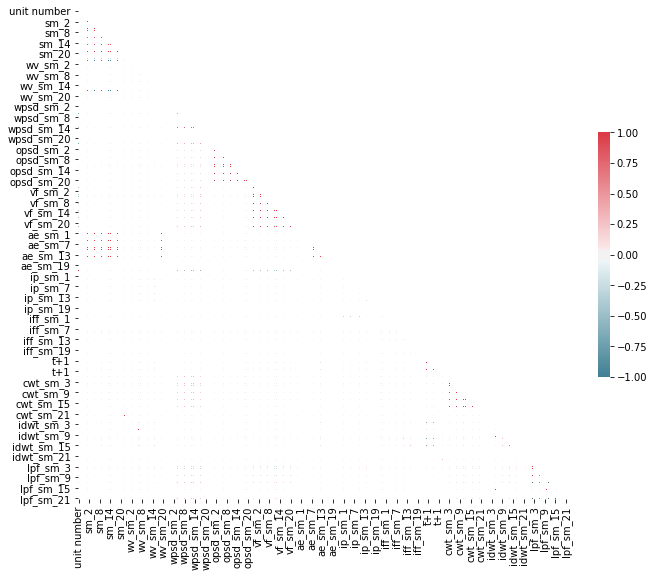

<Figure size 3600x3600 with 0 Axes>

<Figure size 3600x3600 with 0 Axes>

In [258]:
#Creating a correlation plot for the variables
import seaborn as sns
corr = new_df_train.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()
plt.figure(figsize=(50,50))

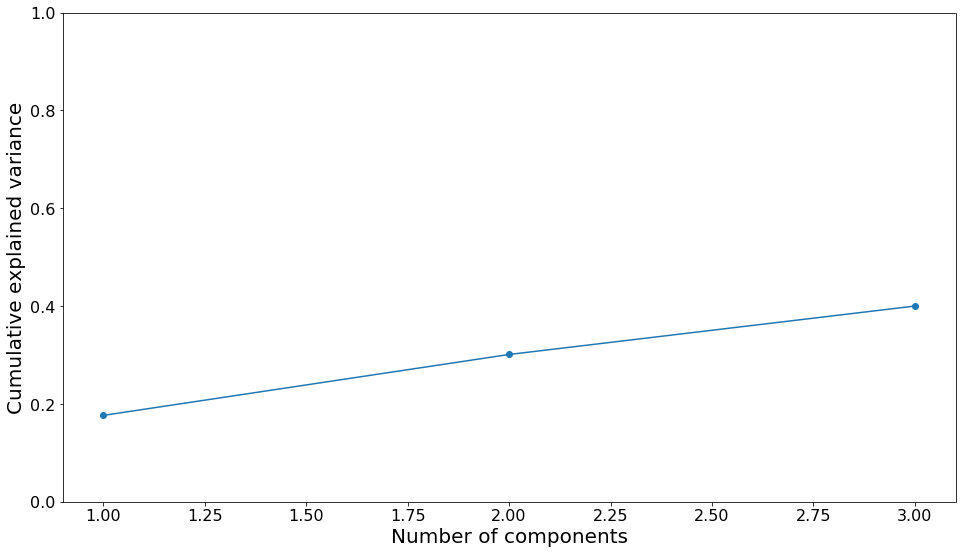

In [261]:
#Variance for components displayed in graph.
#PCA with 3 components.
plt.plot(range(1,pca.n_components+1), np.cumsum(pca.explained_variance_ratio_),'-o')
plt.xlabel('Number of components', fontsize=20)
plt.ylabel('Cumulative explained variance', fontsize=20);
plt.tick_params(labelsize=16)
plt.ylim(0,1)

plt.show()

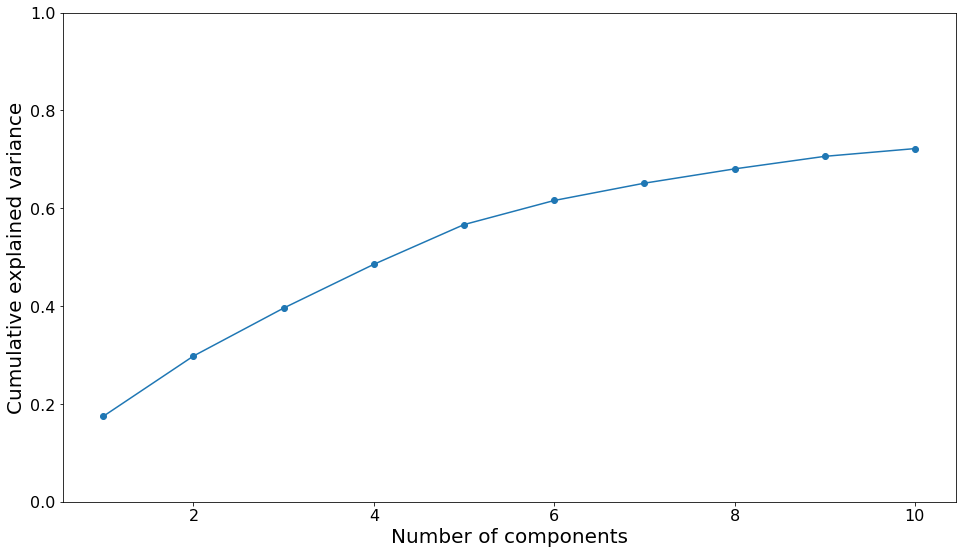

In [264]:
#PCA with 10 components
E= StandardScaler().fit_transform(E)
pca = PCA(n_components=10, svd_solver='full')
PC_scores = pca.fit_transform(E)
scores_pd = pd.DataFrame(data = PC_scores
                         ,columns = ['PC1', 'PC2', 'PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']
                         ,index =E_index)
loadings_pd = pd.DataFrame(data = pca.components_.T
                           ,columns = ['PC1', 'PC2', 'PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']
                           ,index = new_df_train.columns)
#Variance for components displayed in graph.
#PCA with 3 components.
plt.plot(range(1,pca.n_components+1), np.cumsum(pca.explained_variance_ratio_),'-o')
plt.xlabel('Number of components', fontsize=20)
plt.ylabel('Cumulative explained variance', fontsize=20);
plt.tick_params(labelsize=16)
plt.ylim(0,1)

plt.show()

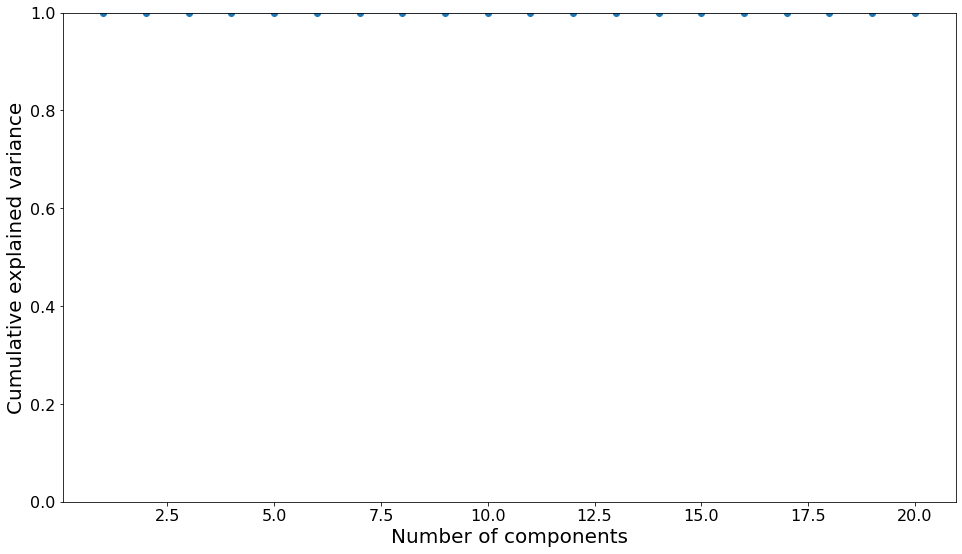

In [265]:
#PCA with 20 components
E= StandardScaler().fit_transform(E)
pca = PCA(n_components=20, svd_solver='full')
PC_scores = pca.fit_transform(E)
scores_pd = pd.DataFrame(data = PC_scores
                         ,columns = ['PC1', 'PC2', 'PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12', 'PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20']
                         ,index =E_index)
loadings_pd = pd.DataFrame(data = pca.components_.T
                           ,columns = ['PC1', 'PC2', 'PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11', 'PC12', 'PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20']
                           ,index = new_df_train.columns)
#Variance for components displayed in graph.
#PCA with 3 components.
plt.plot(range(1,pca.n_components+1), np.cumsum(pca.explained_variance_ratio_),'-o')
plt.xlabel('Number of components', fontsize=20)
plt.ylabel('Cumulative explained variance', fontsize=20);
plt.tick_params(labelsize=16)
plt.ylim(0,1)

plt.show()

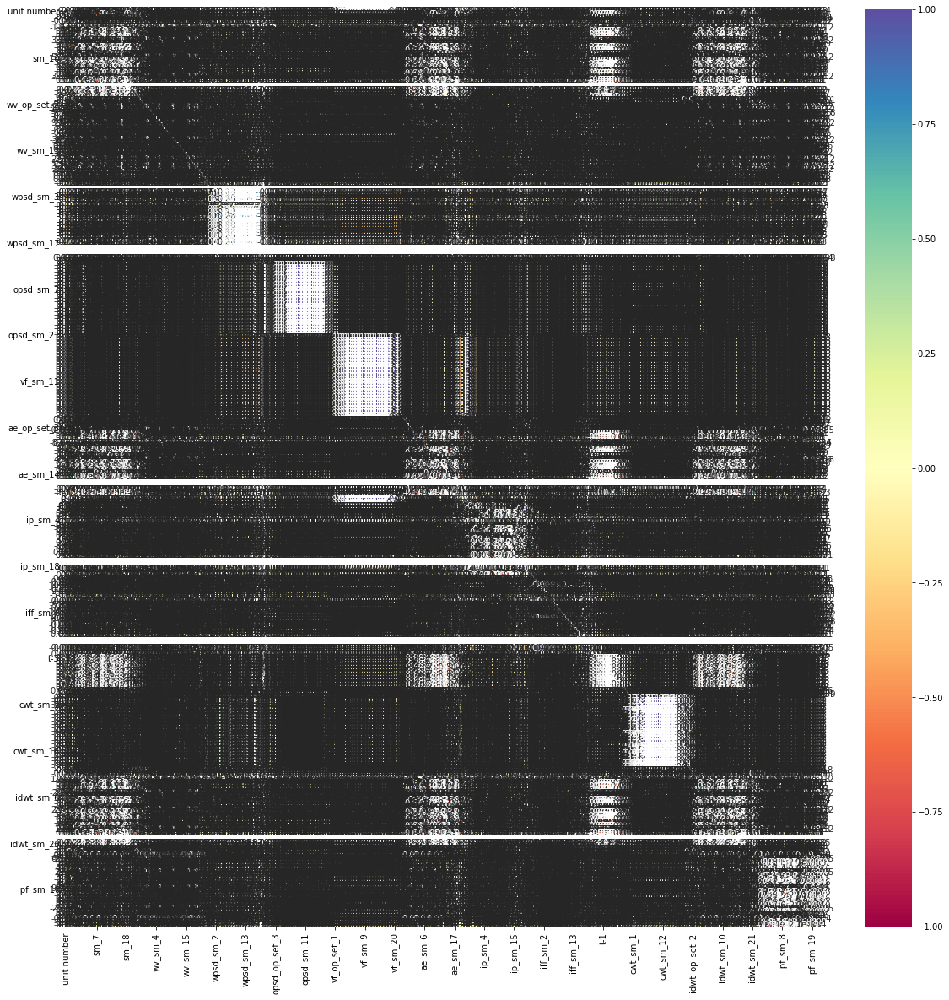

In [204]:
sns.heatmap(new_df_train.corr(),annot=True,cmap='Spectral',linewidths=0.01)
fig=plt.gcf()
fig.set_size_inches(20,20)
plt.show()

In [269]:
#Load training set
new_df_train = pd.concat([df_train, wvt_train,wpsd_train, opsd_train,vf_train,fft_train,ae_train,ip_train,iff_train,tempshift_train,srtempshift_train,rollshift_train,cwtt_train,idwt_train,lpf_train], axis=1)
#Load testing set
new_df_test= pd.concat([data_test_1, wvt_test,wpsd_test, opsd_test,vf_test,fft_test,ae_test,ip_test,iff_test,tempshift_test,srtempshift_test,rollshift_test,cwtt_test,idwt_test,lpf_test], axis=1)

In [12]:
#Filling NaN values in both training and testing datasets
new_df_train=new_df_train.fillna(0)
new_df_test=new_df_test.fillna(0)

In [16]:
X_train=new_df_train.drop(columns=['RUL'])
y_train=new_df_train['RUL']
X_test=new_df_test.drop(columns=['RUL'])
y_test=new_df_test['RUL']

In [17]:
#Create separate lists for training and testing dataset columns.
traincolumns=X_train.columns
testcolumns=X_test.columns
trainc=traincolumns.values.tolist()
testc=testcolumns.values.tolist()

In [18]:
#Remove uncommon column in both datasets
def Diff(li1, li2): 
    li_dif = [i for i in li1 + li2 if i not in li1 or i not in li2] 
    return li_dif 
  
# Driver Code 
list1 = Diff(testc, trainc) 
print(list1) 

['fft_test_1', 'cwt_op_Set_1']


In [19]:
X_test=X_test.drop(columns=['fft_test_1', 'cwt_op_Set_1'])

In [20]:
#Confirm the shape of the generated new dataframes.
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(20632, 277)
(53760, 277)
(20632,)
(53760,)


In [284]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
from sklearn.svm import SVR
from sklearn import model_selection
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
models = [LinearRegression(), LogisticRegression(), SVR(), BaggingRegressor(), GradientBoostingRegressor(), RandomForestRegressor(), DecisionTreeRegressor(), KNeighborsRegressor(), Lasso(), Ridge()]


In [285]:
#Evaluating regression models using the training datasets with the newly generated features.
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_absolute_error(y_train, predictions))

LinearRegression 9.176061964906294e-09


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression 43.10289841023653
SVR 56.725413529681475
BaggingRegressor 0.004153741760372299
GradientBoostingRegressor 0.38626431603010675
RandomForestRegressor 0.0028208607987591176
DecisionTreeRegressor 0.0
KNeighborsRegressor 9.472663823187283


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 37475.62783518223, tolerance: 9789.253033656458



Lasso 0.04839632864274144
Ridge 6.846433872356108e-07


In [302]:
#Evaluating regression models using the training datasets with the newly generated features.
from sklearn.metrics import r2_score
for model in models:
    predictions = model.predict(X_train)
    print(type(model).__name__, r2_score(y_train, predictions))

LinearRegression 1.0
LogisticRegression 0.1941674944065156
SVR -0.004792419546161497
BaggingRegressor 0.9999991440613527
GradientBoostingRegressor 0.9999387068856667
RandomForestRegressor 0.9999994927437279
DecisionTreeRegressor 1.0
KNeighborsRegressor 0.9154463437451026
Lasso 0.999979848539556
Ridge 0.9999999999999996


In [303]:
from sklearn.metrics import mean_tweedie_deviance
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_tweedie_deviance(y_train, predictions))

LinearRegression 4.448507757801445e-20


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression 3823.4287999224507
SVR 4767.432745849783
BaggingRegressor 0.003941934858472296
GradientBoostingRegressor 0.2908170828954223
RandomForestRegressor 0.002506926134160516
DecisionTreeRegressor 0.0
KNeighborsRegressor 401.18124079100426


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 37475.62783518223, tolerance: 9789.253033656458



Lasso 0.09561251710163111
Ridge 2.1316141900212603e-12


In [304]:
from sklearn.metrics import median_absolute_error
for model in models:
    predictions = model.predict(X_train)
    print(type(model).__name__, median_absolute_error(y_train, predictions))

LinearRegression 1.2522605175036006e-10
LogisticRegression 29.0
SVR 52.099374321055535
BaggingRegressor 0.0
GradientBoostingRegressor 0.29682815804201823
RandomForestRegressor 0.0
DecisionTreeRegressor 0.0
KNeighborsRegressor 3.0
Lasso 0.013561009415070657
Ridge 4.7582275897184445e-07


In [300]:
#Evaluating regression models using the testing datasets with the newly generated features.
for model in models:
    predictions = model.predict(X_test)
    print(type(model).__name__, mean_absolute_error(y_test, predictions))

LinearRegression 99.37959858626562
LogisticRegression 100.07911086309524
SVR 88.92879504374075
BaggingRegressor 99.36281436011906
GradientBoostingRegressor 99.91737023899869
RandomForestRegressor 99.36875241815476
DecisionTreeRegressor 99.37235863095238
KNeighborsRegressor 79.98752232142856
Lasso 99.60239011227134
Ridge 99.42850998941859


In [305]:
#Evaluating regression models using the testing datasets with the newly generated features.
for model in models:
    predictions = model.predict(X_test)
    print(type(model).__name__, r2_score(y_test, predictions))

LinearRegression -119.35867853681087
LogisticRegression -11.51655114998868
SVR -6.271240443024702
BaggingRegressor -11.097323719612572
GradientBoostingRegressor -11.201629584344541
RandomForestRegressor -11.100137557698238
DecisionTreeRegressor -11.102039819742858
KNeighborsRegressor -7.137840868403822
Lasso -11.142670558688623
Ridge -11.112124572008051


In [306]:
#Evaluating regression models using the testing datasets with the newly generated features.
for model in models:
    predictions = model.predict(X_test)
    print(type(model).__name__, mean_tweedie_deviance(y_test, predictions))

LinearRegression 145084.30344512052
LogisticRegression 15087.861774553572
SVR 8764.992002928824
BaggingRegressor 14582.511263392857
GradientBoostingRegressor 14708.244977935512
RandomForestRegressor 14585.903156222099
DecisionTreeRegressor 14588.196205357142
KNeighborsRegressor 9809.620613095238
Lasso 14637.173832314089
Ridge 14600.352696900582


In [307]:
#Evaluating regression models using the testing datasets with the newly generated features.
for model in models:
    predictions = model.predict(X_test)
    print(type(model).__name__, median_absolute_error(y_test, predictions))

LinearRegression 69.30740571557095
LogisticRegression 92.0
SVR 102.84580690350953
BaggingRegressor 90.0
GradientBoostingRegressor 90.52676040304044
RandomForestRegressor 90.0
DecisionTreeRegressor 90.0
KNeighborsRegressor 87.4
Lasso 90.45045948002473
Ridge 90.06657084966866


## Regression Model Evaluation

### On Dataset FD002 

In [85]:
y=df_2['RUL']
X=df_2.drop(columns=['RUL'])
seed = 1
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

In [86]:
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_absolute_error(y_train, predictions))

LinearRegression 57.319486761436906


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 30.209819264593865
SVR 27.45460752799841
BaggingRegressor 5.234935253791289
GradientBoostingRegressor 17.491082728674197
RandomForestRegressor 4.422994944948411
DecisionTreeRegressor 0.0
KNeighborsRegressor 20.98284052350945
Lasso 31.58975254680859
Ridge 30.619937207610707


In [90]:
from sklearn.metrics import r2_score
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, r2_score(y_train, predictions))

LinearRegression 0.6656562480945707


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 0.5964246945193712
SVR 0.6823809120616358
BaggingRegressor 0.9848924985562073
GradientBoostingRegressor 0.882244731216133
RandomForestRegressor 0.991357156826781
DecisionTreeRegressor 1.0
KNeighborsRegressor 0.8052836336424275
Lasso 0.6445795426231673
Ridge 0.6656531021976397


In [88]:
from sklearn.metrics import mean_tweedie_deviance
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_tweedie_deviance(y_train, predictions))

LinearRegression 1581.0668248643915


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 1908.4535696973894
SVR 1501.978128860254
BaggingRegressor 63.30668374766291
GradientBoostingRegressor 556.848895384243
RandomForestRegressor 41.010130184890244
DecisionTreeRegressor 0.0
KNeighborsRegressor 920.7876185859704
Lasso 1680.73574228355
Ridge 1581.0817013896558


In [89]:
from sklearn.metrics import median_absolute_error
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, median_absolute_error(y_train, predictions))

LinearRegression 24.880982523883688


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 20.0
SVR 19.216656907710345
BaggingRegressor 3.0
GradientBoostingRegressor 12.72079829256371
RandomForestRegressor 2.950000000000003
DecisionTreeRegressor 0.0
KNeighborsRegressor 14.0
Lasso 26.06284486113428
Ridge 24.876464932436534


In [91]:
from sklearn.metrics import mean_squared_error
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_squared_error(y_train, predictions))

LinearRegression 1581.0668248643915


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 1908.4535696973894
SVR 1501.978128860254
BaggingRegressor 64.71032407727996
GradientBoostingRegressor 556.848895384243
RandomForestRegressor 40.79835621494356
DecisionTreeRegressor 0.0
KNeighborsRegressor 920.7876185859704
Lasso 1680.73574228355
Ridge 1581.0817013896558


### On Dataset FD003

In [107]:
y=df_3['RUL']
X=df_3.drop(columns=['RUL'])
test_size = 0.30
seed = 1
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

In [108]:
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, mean_absolute_error(y_train, predictions))

LinearRegression 45.29289597203189


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 66.11552242256126
SVR 76.60155284283316
BaggingRegressor 5.081640083217753
GradientBoostingRegressor 23.55220207672481
RandomForestRegressor 4.133155917706888
DecisionTreeRegressor 0.0
KNeighborsRegressor 20.641736014794265
Lasso 46.96479546766109
Ridge 45.33766036574838


In [109]:
from sklearn.metrics import r2_score
for model in models:
    model.fit(X_train, y_train)
    predictions = model.predict(X_train)
    print(type(model).__name__, r2_score(y_train, predictions))

LinearRegression 0.6227375269477209


C:\Users\Amardeep\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression 0.10785398916290323
SVR -0.012713507949169589
BaggingRegressor 0.992678975078574
GradientBoostingRegressor 0.88860447986387
RandomForestRegressor 0.9953651361643285
DecisionTreeRegressor 1.0
KNeighborsRegressor 0.8665589441453865
Lasso 0.6004278656291211
Ridge 0.6223392672644542


In [334]:
import pandas
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
# define a base model
def baseline_model():
	# create model
	model = Sequential()
	model.add(Dense(13, input_dim=277, kernel_initializer='normal', activation='relu'))
	model.add(Dense(1, kernel_initializer='normal'))
	# Compile model
	model.compile(loss='mean_squared_error', optimizer='adam')
	return model

In [335]:
estimator = KerasRegressor(build_fn=baseline_model, epochs=100, batch_size=5, verbose=0)
kfold = KFold(n_splits=10)
results = cross_val_score(estimator, X_train, y_train, cv=kfold)
print("Results: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Results: -918391.66 (2740612.00) MSE


In [336]:
# define the model
def larger_model():
	# create model
	model = Sequential()
	model.add(Dense(13, input_dim=277, kernel_initializer='normal', activation='relu'))
	model.add(Dense(6, kernel_initializer='normal', activation='relu'))
	model.add(Dense(1, kernel_initializer='normal'))
	# Compile model
	model.compile(loss='mean_squared_error', optimizer='adam')
	return model

In [337]:
estimators = []
estimators.append(('standardize', StandardScaler()))
estimators.append(('mlp', KerasRegressor(build_fn=larger_model, epochs=50, batch_size=5, verbose=0)))
pipeline = Pipeline(estimators)
kfold = KFold(n_splits=10)
results = cross_val_score(pipeline, X_train, y_train, cv=kfold)
print("Larger: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Larger: -4292869570117631055411600687104.00 (12878608710352892603284848640000.00) MSE


In [344]:
# Use scikit-learn to grid search the batch size and epochs
import numpy
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
# Function to create model, required for KerasRegressor
def create_model():
	# create model
	model = Sequential()
	model.add(Dense(500, input_dim=277, activation='relu'))
	model.add(Dense(250, activation='sigmoid'))
	model.add(Dense(125, activation='sigmoid'))
	model.add(Dense(75, activation='sigmoid'))
	model.add(Dense(25, activation='sigmoid'))
	model.add(Dense(1, activation='sigmoid'))
	# Compile model
	model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])
	return model
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
model = KerasRegressor(build_fn=create_model, verbose=0)
# define the grid search parameters
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 359632.396635 using {'batch_size': 10, 'epochs': 100}
25846.730110 (1221.743248) with: {'batch_size': 10, 'epochs': 10}
175077.893464 (11751.001033) with: {'batch_size': 10, 'epochs': 50}
359632.396635 (10790.338930) with: {'batch_size': 10, 'epochs': 100}
11932.881264 (235.292823) with: {'batch_size': 20, 'epochs': 10}
76756.917102 (4642.555847) with: {'batch_size': 20, 'epochs': 50}
168518.745108 (8607.688085) with: {'batch_size': 20, 'epochs': 100}
6764.786024 (86.330352) with: {'batch_size': 40, 'epochs': 10}
36399.454209 (4711.014290) with: {'batch_size': 40, 'epochs': 50}
80395.285624 (4355.707769) with: {'batch_size': 40, 'epochs': 100}
4413.891059 (630.212539) with: {'batch_size': 60, 'epochs': 10}
22495.074734 (3635.743452) with: {'batch_size': 60, 'epochs': 50}
44106.548482 (7744.469633) with: {'batch_size': 60, 'epochs': 100}
3437.357172 (348.780371) with: {'batch_size': 80, 'epochs': 10}
16123.090058 (1415.071830) with: {'batch_size': 80, 'epochs': 50}
30658.433155 (2

In [354]:
# Use scikit-learn to grid search the batch size and epochs
import numpy
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
# Function to create model, required for KerasClassifier
def create_model(optimizer='adam'):
	# create model
	model = Sequential()
	model.add(Dense(500, input_dim=277, activation='relu'))
	model.add(Dense(250, activation='sigmoid'))
	model.add(Dense(125, activation='sigmoid'))
	model.add(Dense(75, activation='sigmoid'))
	model.add(Dense(25, activation='sigmoid'))
	model.add(Dense(1, activation='sigmoid'))
	# Compile model
	model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['accuracy'])
	return model
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
# create model
model = KerasRegressor(build_fn=create_model, epochs=100, batch_size=10, verbose=0)
# define the grid search parameters
optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
param_grid = dict(optimizer=optimizer)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 407784764.246532 using {'optimizer': 'SGD'}
407784764.246532 (7725423.621242) with: {'optimizer': 'SGD'}
374070.848061 (14278.049021) with: {'optimizer': 'RMSprop'}
12653.782505 (2916.330894) with: {'optimizer': 'Adagrad'}
2258247.273576 (167550.744153) with: {'optimizer': 'Adadelta'}
353535.851474 (19254.734769) with: {'optimizer': 'Adam'}
503533.228638 (16783.636621) with: {'optimizer': 'Adamax'}
714100.194012 (30833.528905) with: {'optimizer': 'Nadam'}


In [21]:
# Use scikit-learn to grid search the learning rate and momentum
import numpy
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from keras.optimizers import SGD
# Function to create model, required for KerasClassifier
def create_model(learn_rate=0.01, momentum=0):
	# create model
	model = Sequential()
	model.add(Dense(500, input_dim=277, activation='relu'))
	model.add(Dense(250, activation='relu'))
	model.add(Dense(125, activation='relu'))
	model.add(Dense(75, activation='relu'))
	model.add(Dense(25, activation='relu'))
	model.add(Dense(1, activation='relu'))
	# Compile model
	optimizer = SGD(lr=learn_rate, momentum=momentum)
	model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['accuracy'])
	return model
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
# create model
model = KerasRegressor(build_fn=create_model, epochs=100, batch_size=10, verbose=0)
# define the grid search parameters
learn_rate = [0.001, 0.01, 0.1, 0.2, 0.3]
momentum = [0.0, 0.2, 0.4, 0.6, 0.8, 0.9]
param_grid = dict(learn_rate=learn_rate, momentum=momentum)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train.values, y_train.values)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 1628.662221 using {'learn_rate': 0.001, 'momentum': 0.2}
578.374291 (1535.239859) with: {'learn_rate': 0.001, 'momentum': 0.0}
1628.662221 (62.233891) with: {'learn_rate': 0.001, 'momentum': 0.2}
398.664034 (1520.560525) with: {'learn_rate': 0.001, 'momentum': 0.4}
1628.662221 (62.233891) with: {'learn_rate': 0.001, 'momentum': 0.6}
539.085252 (1550.133118) with: {'learn_rate': 0.001, 'momentum': 0.8}
1628.662221 (62.233891) with: {'learn_rate': 0.001, 'momentum': 0.9}
477.011321 (1571.409744) with: {'learn_rate': 0.01, 'momentum': 0.0}
578.374291 (1535.239859) with: {'learn_rate': 0.01, 'momentum': 0.2}
578.654516 (1534.843680) with: {'learn_rate': 0.01, 'momentum': 0.4}
539.085252 (1550.133118) with: {'learn_rate': 0.01, 'momentum': 0.6}
578.374291 (1535.239859) with: {'learn_rate': 0.01, 'momentum': 0.8}
580.483058 (1532.258517) with: {'learn_rate': 0.01, 'momentum': 0.9}
539.085252 (1550.133118) with: {'learn_rate': 0.1, 'momentum': 0.0}
1627.869772 (61.889406) with: {'learn_

In [22]:
# Use scikit-learn to grid search the weight initialization
import numpy
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
# Function to create model, required for KerasRegressor
def create_model(init_mode='uniform'):
	# create model
	model = Sequential()
	model.add(Dense(500, input_dim=277,kernel_initializer=init_mode, activation='relu'))
	model.add(Dense(250, activation='relu'))
	model.add(Dense(125, activation='relu'))
	model.add(Dense(75, activation='relu'))
	model.add(Dense(25, activation='relu'))
	model.add(Dense(1, kernel_initializer=init_mode, activation='relu'))
	# Compile model
	model.compile(loss='mean_squared_error', optimizer='sgd', metrics=['accuracy'])
	return model
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)
# create model
model = KerasRegressor(build_fn=create_model, epochs=100, batch_size=10, verbose=0)
# define the grid search parameters
init_mode = ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']
param_grid = dict(init_mode=init_mode)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: -16366.185527 using {'init_mode': 'zero'}
nan (nan) with: {'init_mode': 'uniform'}
nan (nan) with: {'init_mode': 'lecun_uniform'}
nan (nan) with: {'init_mode': 'normal'}
-16366.185527 (1400.811468) with: {'init_mode': 'zero'}
-16366.185527 (1400.811468) with: {'init_mode': 'glorot_normal'}
-16366.185527 (1400.811468) with: {'init_mode': 'glorot_uniform'}
-16366.185527 (1400.811468) with: {'init_mode': 'he_normal'}
-16366.185527 (1400.811468) with: {'init_mode': 'he_uniform'}


In [ ]:
# Function to create model, required for KerasClassifier
def create_model(activation='relu'):
	# create model
	model = Sequential()
	model.add(Dense(500, input_dim=277, kernel_initializer='zero', activation=activation))
	model.add(Dense(250, activation='relu'))
	model.add(Dense(125, activation='relu'))
	model.add(Dense(75, activation='relu'))
	model.add(Dense(25, activation='relu'))
	model.add(Dense(1, kernel_initializer='zero', activation='sigmoid'))
	# Compile model
	model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])
	return model
# fix random seed for reproducibility
seed = 7
numpy.random.seed(seed)

# create model
model = KerasRegressor(build_fn=create_model, epochs=100, batch_size=10, verbose=0)
# define the grid search parameters
activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']
param_grid = dict(activation=activation)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [353]:
from keras.models import model_from_json
# serialize model to JSON

model_json = model.model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model.h5")
print("Saved model to disk")


AttributeError: 'KerasRegressor' object has no attribute 'model'